In [95]:
# Import all the required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns



from sklearn.model_selection import RandomizedSearchCV

from sklearn.preprocessing import StandardScaler, QuantileTransformer
from sklearn.model_selection import GroupKFold, cross_val_score
from sklearn.metrics import mean_squared_error
from sklearn.pipeline import make_pipeline
from sklearn.impute import SimpleImputer



from sklearn.preprocessing import MinMaxScaler

from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, VotingRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import train_test_split,cross_val_score

from xgboost import XGBRegressor
from catboost import CatBoostRegressor
from sklearn.metrics import mean_squared_error
from sklearn.impute import SimpleImputer
import optuna

In [2]:
train_df  = pd.read_csv('train.csv', index_col='ID_LAT_LON_YEAR_WEEK')

train_df.head()

,latitude,longitude,year,week_no,SulphurDioxide_SO2_column_number_density,SulphurDioxide_SO2_column_number_density_amf,SulphurDioxide_SO2_slant_column_number_density,SulphurDioxide_cloud_fraction,SulphurDioxide_sensor_azimuth_angle,SulphurDioxide_sensor_zenith_angle,...,Cloud_cloud_top_height,Cloud_cloud_base_pressure,Cloud_cloud_base_height,Cloud_cloud_optical_depth,Cloud_surface_albedo,Cloud_sensor_azimuth_angle,Cloud_sensor_zenith_angle,Cloud_solar_azimuth_angle,Cloud_solar_zenith_angle,emission
ID_LAT_LON_YEAR_WEEK,,,,,,,,,,,,,,,,,,,,,
ID_-0.510_29.290_2019_00,-0.51,29.29,2019,0,-0.000108,0.603019,-0.000065,0.255668,-98.593887,50.843559,...,3664.436218,61085.809570,2615.120483,15.568533,0.272292,-12.628986,35.632416,-138.786423,30.752140,3.750994
ID_-0.510_29.290_2019_01,-0.51,29.29,2019,1,0.000021,0.728214,0.000014,0.130988,16.592861,39.137194,...,3651.190311,66969.478735,3174.572424,8.690601,0.256830,30.359375,39.557633,-145.183930,27.251779,4.025176
ID_-0.510_29.290_2019_02,-0.51,29.29,2019,2,0.000514,0.748199,0.000385,0.110018,72.795837,52.868816,...,4216.986492,60068.894448,3516.282669,21.103410,0.251101,15.377883,30.401823,-142.519545,26.193296,4.231381
ID_-0.510_29.290_2019_03,-0.51,29.29,2019,3,NaN,NaN,NaN,NaN,NaN,NaN,...,5228.507736,51064.547339,4180.973322,15.386899,0.262043,-11.293399,24.380357,-132.665828,28.829155,4.305286
ID_-0.510_29.290_2019_04,-0.51,29.29,2019,4,-0.000079,0.676296,-0.000048,0.121164,4.121269,35.515587,...,3980.598120,63751.125781,3355.710107,8.114694,0.235847,38.532263,37.392979,-141.509805,22.204612,4.347317


In [3]:
pd.set_option("display.max_columns",85)
pd.set_option("display.max_rows",85)

In [4]:
train_df

,latitude,longitude,year,week_no,SulphurDioxide_SO2_column_number_density,SulphurDioxide_SO2_column_number_density_amf,SulphurDioxide_SO2_slant_column_number_density,SulphurDioxide_cloud_fraction,SulphurDioxide_sensor_azimuth_angle,SulphurDioxide_sensor_zenith_angle,SulphurDioxide_solar_azimuth_angle,SulphurDioxide_solar_zenith_angle,SulphurDioxide_SO2_column_number_density_15km,CarbonMonoxide_CO_column_number_density,CarbonMonoxide_H2O_column_number_density,CarbonMonoxide_cloud_height,CarbonMonoxide_sensor_altitude,CarbonMonoxide_sensor_azimuth_angle,CarbonMonoxide_sensor_zenith_angle,CarbonMonoxide_solar_azimuth_angle,CarbonMonoxide_solar_zenith_angle,NitrogenDioxide_NO2_column_number_density,NitrogenDioxide_tropospheric_NO2_column_number_density,NitrogenDioxide_stratospheric_NO2_column_number_density,NitrogenDioxide_NO2_slant_column_number_density,NitrogenDioxide_tropopause_pressure,NitrogenDioxide_absorbing_aerosol_index,NitrogenDioxide_cloud_fraction,NitrogenDioxide_sensor_altitude,NitrogenDioxide_sensor_azimuth_angle,NitrogenDioxide_sensor_zenith_angle,NitrogenDioxide_solar_azimuth_angle,NitrogenDioxide_solar_zenith_angle,Formaldehyde_tropospheric_HCHO_column_number_density,Formaldehyde_tropospheric_HCHO_column_number_density_amf,Formaldehyde_HCHO_slant_column_number_density,Formaldehyde_cloud_fraction,Formaldehyde_solar_zenith_angle,Formaldehyde_solar_azimuth_angle,Formaldehyde_sensor_zenith_angle,Formaldehyde_sensor_azimuth_angle,UvAerosolIndex_absorbing_aerosol_index,UvAerosolIndex_sensor_altitude,UvAerosolIndex_sensor_azimuth_angle,UvAerosolIndex_sensor_zenith_angle,UvAerosolIndex_solar_azimuth_angle,UvAerosolIndex_solar_zenith_angle,Ozone_O3_column_number_density,Ozone_O3_column_number_density_amf,Ozone_O3_slant_column_number_density,Ozone_O3_effective_temperature,Ozone_cloud_fraction,Ozone_sensor_azimuth_angle,Ozone_sensor_zenith_angle,Ozone_solar_azimuth_angle,Ozone_solar_zenith_angle,UvAerosolLayerHeight_aerosol_height,UvAerosolLayerHeight_aerosol_pressure,UvAerosolLayerHeight_aerosol_optical_depth,UvAerosolLayerHeight_sensor_zenith_angle,UvAerosolLayerHeight_sensor_azimuth_angle,UvAerosolLayerHeight_solar_azimuth_angle,UvAerosolLayerHeight_solar_zenith_angle,Cloud_cloud_fraction,Cloud_cloud_top_pressure,Cloud_cloud_top_height,Cloud_cloud_base_pressure,Cloud_cloud_base_height,Cloud_cloud_optical_depth,Cloud_surface_albedo,Cloud_sensor_azimuth_angle,Cloud_sensor_zenith_angle,Cloud_solar_azimuth_angle,Cloud_solar_zenith_angle,emission
ID_LAT_LON_YEAR_WEEK,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
ID_-0.510_29.290_2019_00,-0.510,29.290,2019,0,-0.000108,0.603019,-0.000065,0.255668,-98.593887,50.843559,-130.050797,35.874496,-0.000027,0.035370,1589.024536,4061.098145,829530.500000,71.111977,52.775928,-149.875565,25.965214,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000117,0.863230,0.000038,0.255668,35.874496,-130.050797,50.843559,-98.593887,-1.280761,829864.546875,-12.628979,35.632416,-138.786446,30.752128,0.115927,2.506609,0.295663,225.731144,0.595473,-12.628979,35.632416,-138.786446,30.752128,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.595473,53534.732422,3664.436218,61085.809570,2615.120483,15.568533,0.272292,-12.628986,35.632416,-138.786423,30.752140,3.750994
ID_-0.510_29.290_2019_01,-0.510,29.290,2019,1,0.000021,0.728214,0.000014,0.130988,16.592861,39.137194,-140.874435,28.965133,0.000012,0.036526,1772.574405,1869.040414,829787.287130,-1.019594,38.982368,-140.158048,29.562000,0.000047,1.639765e-05,0.000030,0.000093,7311.869141,-1.935386,0.067038,829859.960368,5.471037,35.265195,-138.343908,30.054262,0.000170,1.172826,0.000143,0.200754,29.071781,-141.814827,43.050213,4.678839,-1.548119,829747.856973,16.152492,43.485327,-142.786141,28.573627,0.116775,2.657704,0.315733,226.172170,0.175166,24.464335,42.596541,-143.097868,28.213655,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.213608,63790.296241,3651.190311,66969.478735,3174.572424,8.690601,0.256830,30.359375,39.557633,-145.183930,27.251779,4.025176
ID_-0.510

In [5]:
train_df.shape

(79023, 75)

# EDA

In [6]:
# Transbecause of too many columns  
train_df.describe().T

,count,mean,std,min,25%,50%,75%,max
latitude,79023.0,-1.891072,0.694522,-3.299000,-2.451000,-1.882000,-1.303000,-0.510000
longitude,79023.0,29.880155,0.810375,28.228000,29.262000,29.883000,30.471000,31.532000
year,79023.0,2020.000000,0.816502,2019.000000,2019.000000,2020.000000,2021.000000,2021.000000
week_no,79023.0,26.000000,15.297155,0.000000,13.000000,26.000000,39.000000,52.000000
SulphurDioxide_SO2_column_number_density,64414.0,0.000048,0.000272,-0.000996,-0.000096,0.000024,0.000153,0.004191
SulphurDioxide_SO2_column_number_density_amf,64414.0,0.834848,0.185382,0.241822,0.705817,0.809118,0.942792,1.885239
SulphurDioxide_SO2_slant_column_number_density,64414.0,0.000035,0.000206,-0.000887,-0.000078,0.000019,0.000121,0.004236
SulphurDioxide_cloud_fraction,64414.0,0.158418,0.071364,0.000000,0.110535,0.161855,0.211824,0.299998
SulphurDioxide_sensor_azimuth_angle,64414.0,-7.925870,64.263368,-179.537059,-56.782383,-12.441726,72.059990,122.095200
SulphurDioxide_sensor_zenith_angle,64414.0,37.436189,14.149950,0.099237,28.844520,37.784299,47.634875,66.242012


* latitude column looks like it should be a normal distribution curve range -3.29 to -.51  
* longitude column looks like it should be a normal distribution curve range 28.22 to 31.53
* year 2021 appears maximum time and 2019 appears minimum time


In [7]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 79023 entries, ID_-0.510_29.290_2019_00 to ID_-3.299_30.301_2021_52
Data columns (total 75 columns):
 #   Column                                                    Non-Null Count  Dtype  
---  ------                                                    --------------  -----  
 0   latitude                                                  79023 non-null  float64
 1   longitude                                                 79023 non-null  float64
 2   year                                                      79023 non-null  int64  
 3   week_no                                                   79023 non-null  int64  
 4   SulphurDioxide_SO2_column_number_density                  64414 non-null  float64
 5   SulphurDioxide_SO2_column_number_density_amf              64414 non-null  float64
 6   SulphurDioxide_SO2_slant_column_number_density            64414 non-null  float64
 7   SulphurDioxide_cloud_fraction                             64414 no

* All the columns are columns are numerical so we dont need work on categorical data
* only latitude, longitude, year and weekno. do not contain any missing values rest all the columns contains missing values
  in fact the column with minimum non null values is UvAerosol more than 99% of the datapoints are missing
* emission our target column has no missiong values

In [8]:
100*(train_df.isnull().sum().sort_values(ascending=False)/train_df.shape[0])

UvAerosolLayerHeight_aerosol_height                         99.444466
UvAerosolLayerHeight_sensor_azimuth_angle                   99.444466
UvAerosolLayerHeight_aerosol_pressure                       99.444466
UvAerosolLayerHeight_aerosol_optical_depth                  99.444466
UvAerosolLayerHeight_sensor_zenith_angle                    99.444466
UvAerosolLayerHeight_solar_zenith_angle                     99.444466
UvAerosolLayerHeight_solar_azimuth_angle                    99.444466
NitrogenDioxide_solar_zenith_angle                          23.183124
NitrogenDioxide_absorbing_aerosol_index                     23.183124
NitrogenDioxide_tropopause_pressure                         23.183124
NitrogenDioxide_NO2_slant_column_number_density             23.183124
NitrogenDioxide_stratospheric_NO2_column_number_density     23.183124
NitrogenDioxide_tropospheric_NO2_column_number_density      23.183124
NitrogenDioxide_NO2_column_number_density                   23.183124
NitrogenDioxide_sens

* visua;;y verified the missing values

## Data Visualization

In [9]:
def UVA_numeric(data,var_group,title):
    """
    Univariate Numerical Anlaysis and plot/print all descriptives and properties along with KDE
    input dataframe, variable group
    returns a loop: calculates all the descriptives of ith variable plots/prints it
    """
    size = len(var_group)
    plt.figure(figsize = (7*size,3),dpi = 140)
    
    #looping each variable group
    for j,i in enumerate(var_group):
        
        #calculating descriptives of variable
        mini = data[i].min()
        maxi = data[i].max()
        mean = data[i].mean()
        median = data[i].median()
        st_dev = data[i].std()
        skew = data[i].skew()
        kurt = data[i].kurtosis()
        
        #calculating points of standard_deviation 
        points = mean - (2*st_dev),mean - st_dev,mean + st_dev,mean + (2*st_dev)
        
        #potting the variable with every piece of information
        plt.subplot(1,size,j+1)
        sns.kdeplot(data[i],shade = True).set_title(title)
        sns.lineplot(points,[0,0,0,0],color = 'black',label = 'std_dev')
        sns.scatterplot([mini,maxi],[0,0],color = 'orange',label ="min/max")
        sns.scatterplot([mean],[0],color = 'red', label = 'mean')
        sns.scatterplot([median],[0],color = 'blue',label = 'median')
        plt.xlabel('{}'.format(i),fontsize=20)
        plt.ylabel('Density')
        plt.title('Title = {};std_dev_1st = {};std_dev_2nd = {};kurtosis = {}; \nskew = {}; range = {}; \nmean = {}; median = {}'.format((title),
                                                                                                                                         
                                                                                                                      (round(points[1],2),round(points[2],2)),
                                                                                                                      (round(points[0],2),round(points[3],2)),
                                                                                                         round(kurt,2),
                                                                                                         round(skew,2),
                                                                                                         (round(mini,2),round(maxi,2)),
                                                                                                         round(mean,2),
                                                                                                         round(median,2)))

C:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\HP\anaconda3\lib\site-

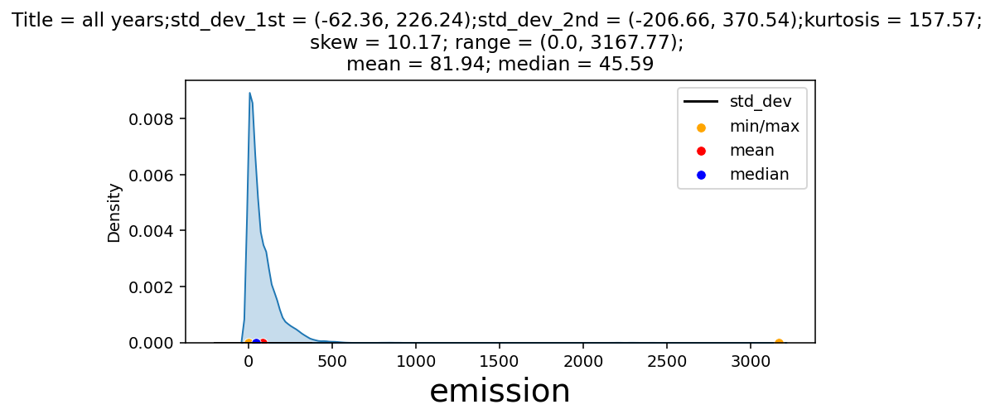

In [10]:
UVA_numeric(train_df,['emission'],'all years')

* clearly it has outliers 
* 95% of the data are around 0(because of range) and 370.84
* Kurtosis says High extreme values which confirms the outliers and a fatter tail is there
* right/posively skewed

C:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\HP\anaconda3\lib\site-

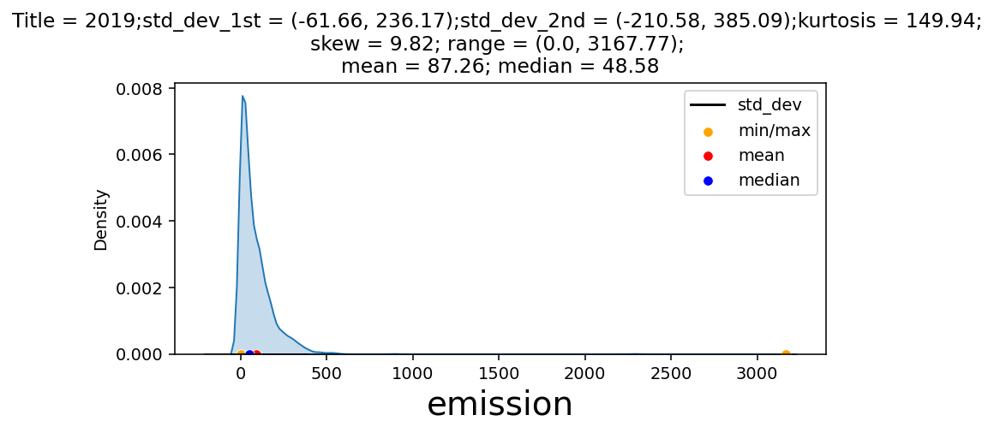

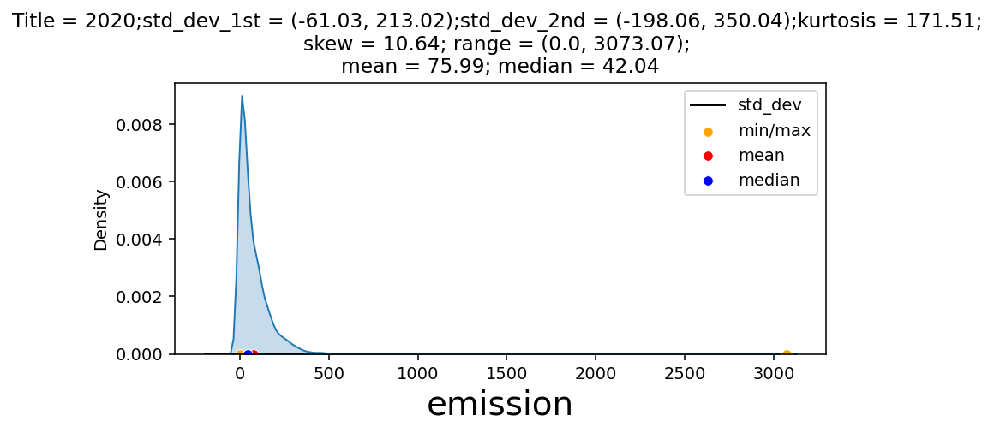

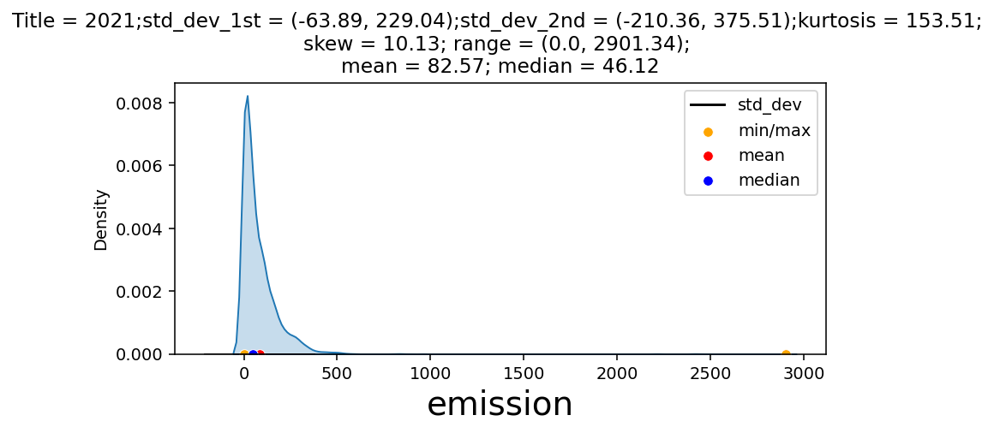

In [11]:
for i in [2019,2020,2021]:
    UVA_numeric(train_df[train_df['year']==i],['emission'],str(i))

* no drastic change over the years in the emission

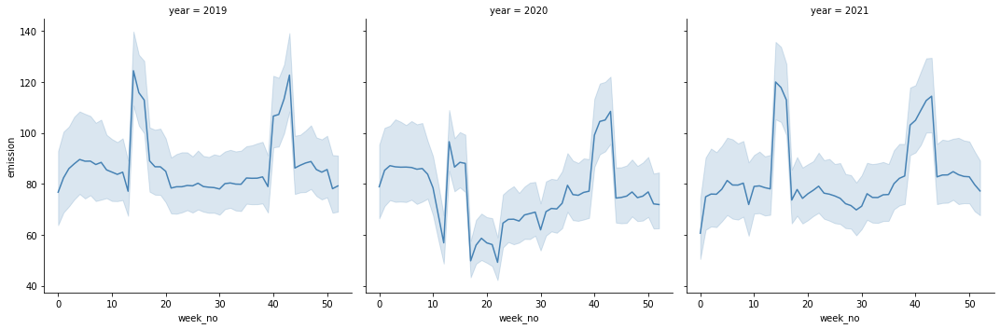

In [12]:
sns.relplot(data = train_df, x = 'week_no', y = 'emission', col = 'year', kind = 'line', color = 'steelblue');

* 2019 and 2021 shows the similar trend and 2020 emissions are quite low and particularly in Q2 in 2020 and it is due to covid

In [13]:
import plotly.express as px

In [14]:
fig = px.scatter_mapbox(train_df[train_df['year']==2019],
                       lat = 'latitude',
                       lon='longitude',
                       color='emission',
                       animation_frame='week_no',
                       zoom=6)
fig.update_layout(mapbox_style='open-street-map')
fig.update_layout(margin={'r':0,'t':0,'l':0,'b':0})
fig.show()

In [15]:
fig = px.scatter_mapbox(train_df[train_df['year']==2020],
                       lat = 'latitude',
                       lon='longitude',
                       color='emission',
                       animation_frame='week_no',
                       zoom=6)
fig.update_layout(mapbox_style='open-street-map')
fig.update_layout(margin={'r':0,'t':0,'l':0,'b':0})
fig.show()

In [16]:
fig = px.scatter_mapbox(train_df[train_df['year']==2021],
                       lat = 'latitude',
                       lon='longitude',
                       color='emission',
                       animation_frame='week_no',
                       zoom=6)
fig.update_layout(mapbox_style='open-street-map')
fig.update_layout(margin={'r':0,'t':0,'l':0,'b':0})
fig.show()

* map shows shows similar emission pattens across rawanda for all the 3 years there are only few locations where emissions are higher that needs further more investigation and also zero emissions

In [17]:
zero_emissions = train_df.groupby(['latitude','longitude'])['emission'].mean().to_frame()
zero_emissions = zero_emissions[zero_emissions['emission']==0]
zero_emissions

,,emission
latitude,longitude,
-2.898,29.002,0.0
-2.859,29.041,0.0
-2.841,29.159,0.0
-2.817,29.283,0.0
-2.496,28.504,0.0
-1.974,28.526,0.0
-1.839,28.761,0.0
-1.833,28.467,0.0
-1.730,28.470,0.0


In [18]:
High_emissions = train_df.groupby(['latitude','longitude'])['emission'].mean().to_frame()
High_emissions = High_emissions[High_emissions['emission']>1500]
High_emissions

,,emission
latitude,longitude,
-2.378,29.222,2233.431628


In [19]:
train_df.drop_duplicates(subset = ['latitude','longitude']).shape[0]

497

* we have 489 unique locations

<AxesSubplot:title={'center':'emissions by locations'}>

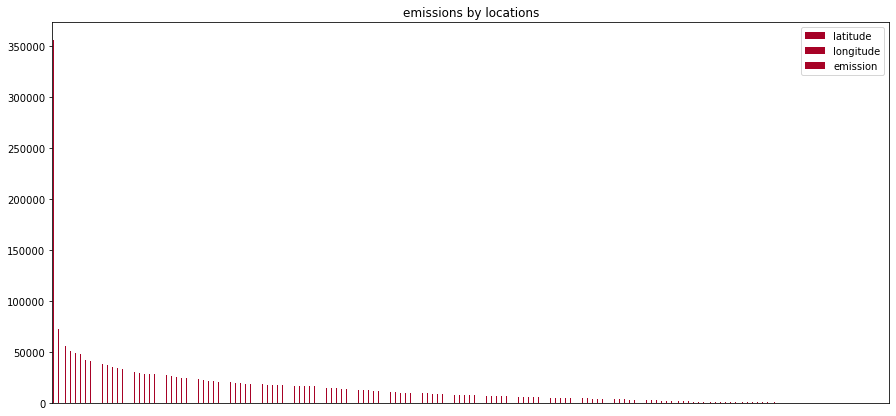

In [20]:
train_df.groupby(['latitude','longitude'])['emission'].sum().reset_index().sort_values(by='emission',ascending=False).plot(kind='bar',
                                                                                                            title='emissions by locations',
                                                                                                            xticks=[],
                                                                                                            figsize=(15,7),
                                                                                                            color=sns.color_palette('RdYlGn',n_colors=497))

* so we can see that 2 locations are having extremely high emissions

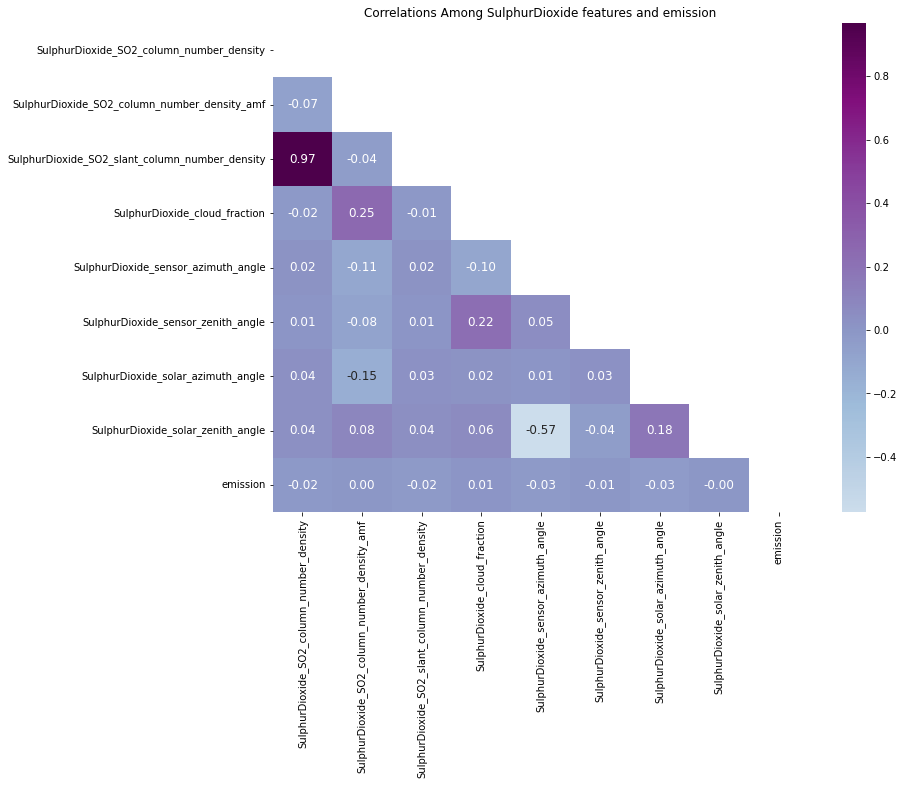

In [21]:
corr_mat = train_df[['SulphurDioxide_SO2_column_number_density',
                  'SulphurDioxide_SO2_column_number_density_amf',
                  'SulphurDioxide_SO2_slant_column_number_density',
                  'SulphurDioxide_cloud_fraction',
                  'SulphurDioxide_sensor_azimuth_angle',
                  'SulphurDioxide_sensor_zenith_angle',
                  'SulphurDioxide_solar_azimuth_angle',
                  'SulphurDioxide_solar_zenith_angle', 'emission']].corr()
data_mask = np.triu(np.ones_like(corr_mat, dtype=bool))
f, ax = plt.subplots(figsize = (12, 9))
sns.heatmap(corr_mat, annot = True, cmap = 'BuPu', fmt = '.2f', center = 0,
            annot_kws = {'size': 12}, mask = data_mask).set_title('Correlations Among SulphurDioxide features and emission');

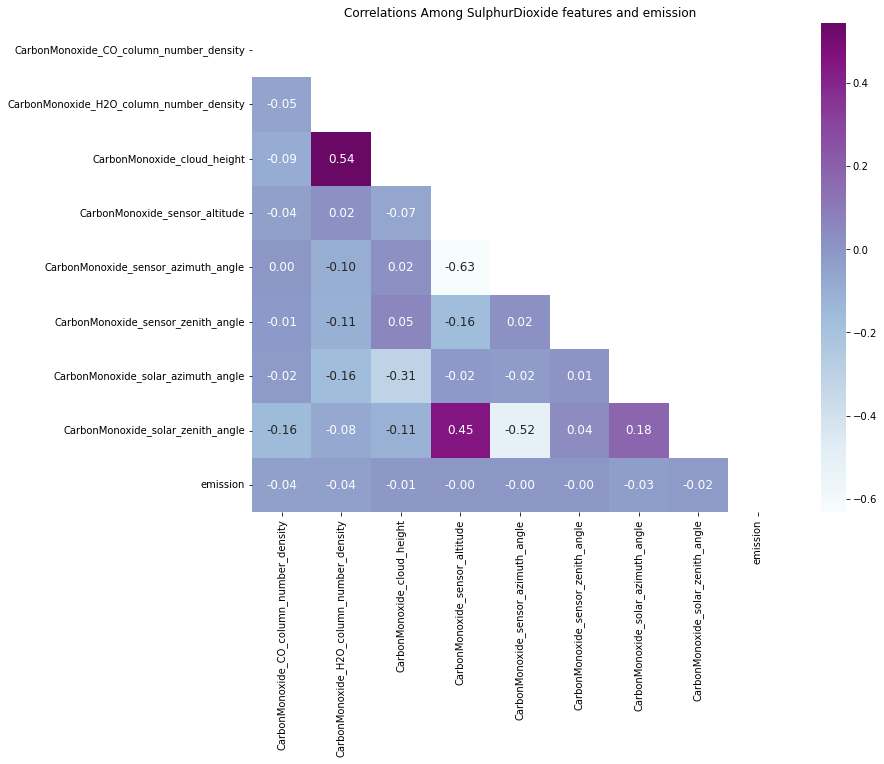

In [22]:
corr_mat = train_df[['CarbonMonoxide_CO_column_number_density',
                  'CarbonMonoxide_H2O_column_number_density',
                  'CarbonMonoxide_cloud_height',
                  'CarbonMonoxide_sensor_altitude',
                  'CarbonMonoxide_sensor_azimuth_angle',
                  'CarbonMonoxide_sensor_zenith_angle',
                  'CarbonMonoxide_solar_azimuth_angle',
                  'CarbonMonoxide_solar_zenith_angle', 'emission']].corr()
data_mask = np.triu(np.ones_like(corr_mat, dtype=bool))
f, ax = plt.subplots(figsize = (12, 9))
sns.heatmap(corr_mat, annot = True, cmap = 'BuPu', fmt = '.2f', center = 0,
            annot_kws = {'size': 12}, mask = data_mask).set_title('Correlations Among SulphurDioxide features and emission');

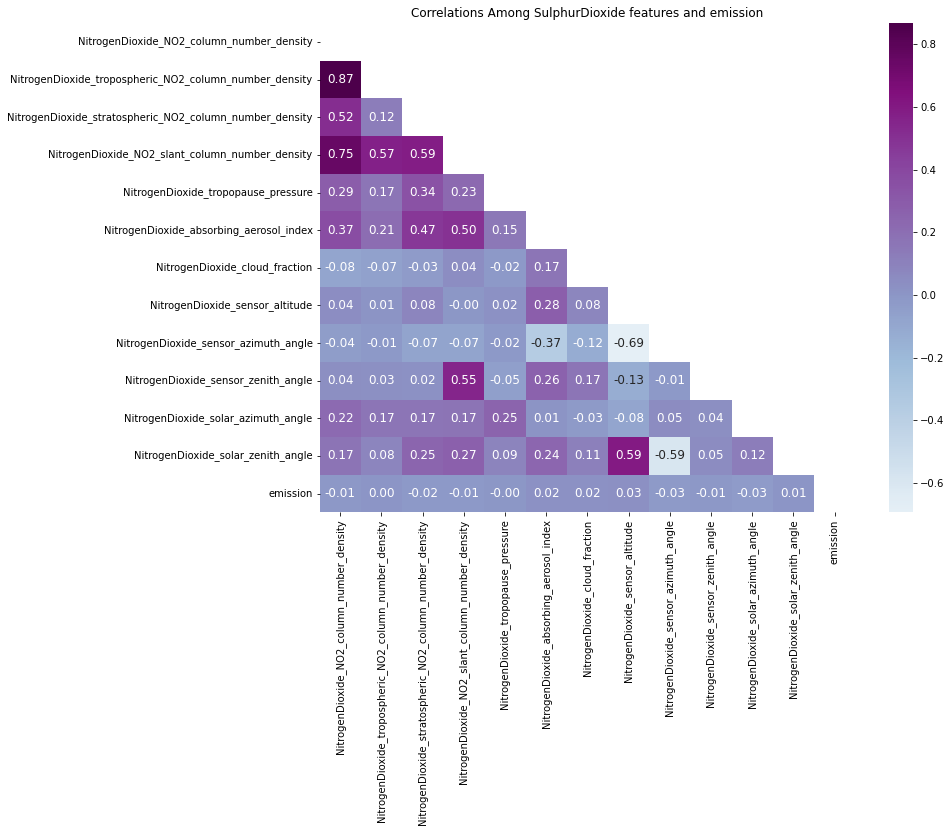

In [23]:
corr_mat = train_df[['NitrogenDioxide_NO2_column_number_density',
                  'NitrogenDioxide_tropospheric_NO2_column_number_density',
                  'NitrogenDioxide_stratospheric_NO2_column_number_density',
                  'NitrogenDioxide_NO2_slant_column_number_density',
                  'NitrogenDioxide_tropopause_pressure',
                  'NitrogenDioxide_absorbing_aerosol_index',
                  'NitrogenDioxide_cloud_fraction',
                  'NitrogenDioxide_sensor_altitude',
                  'NitrogenDioxide_sensor_azimuth_angle',
                  'NitrogenDioxide_sensor_zenith_angle',
                  'NitrogenDioxide_solar_azimuth_angle',
                  'NitrogenDioxide_solar_zenith_angle', 'emission']].corr()
data_mask = np.triu(np.ones_like(corr_mat, dtype=bool))
f, ax = plt.subplots(figsize = (12, 9))
sns.heatmap(corr_mat, annot = True, cmap = 'BuPu', fmt = '.2f', center = 0,
            annot_kws = {'size': 12}, mask = data_mask).set_title('Correlations Among SulphurDioxide features and emission');

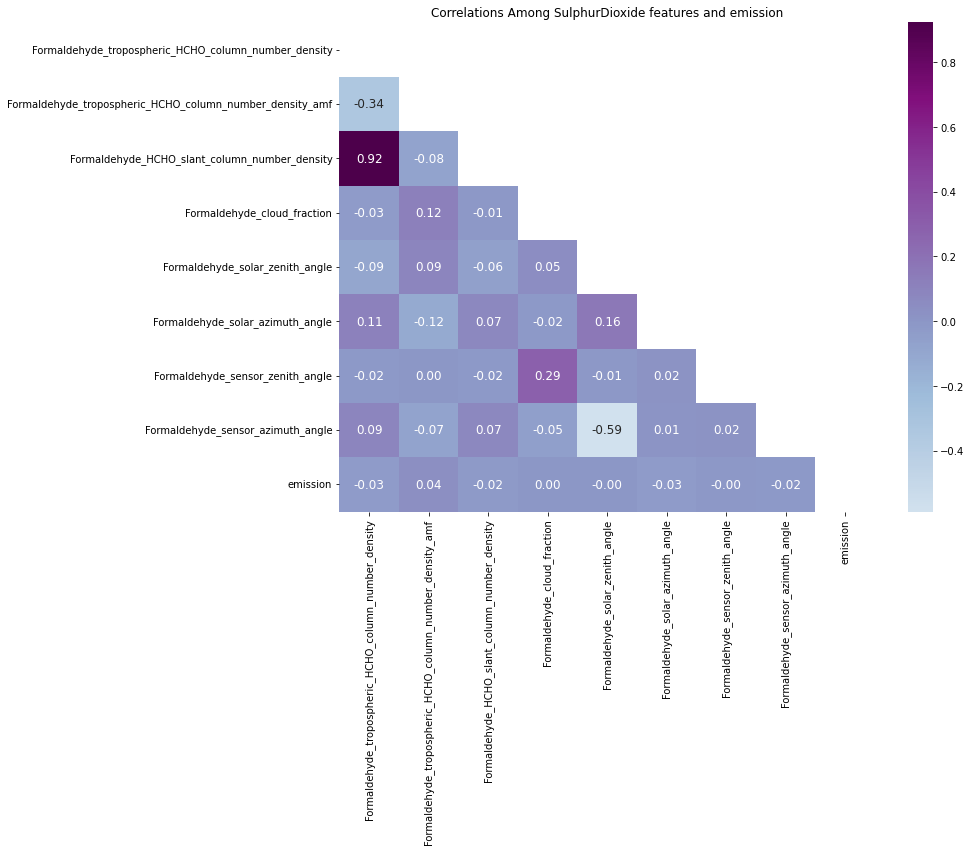

In [24]:
corr_mat = train_df[['Formaldehyde_tropospheric_HCHO_column_number_density',
                  'Formaldehyde_tropospheric_HCHO_column_number_density_amf',
                  'Formaldehyde_HCHO_slant_column_number_density',
                  'Formaldehyde_cloud_fraction',
                  'Formaldehyde_solar_zenith_angle',
                  'Formaldehyde_solar_azimuth_angle',
                  'Formaldehyde_sensor_zenith_angle',
                  'Formaldehyde_sensor_azimuth_angle', 'emission']].corr()
data_mask = np.triu(np.ones_like(corr_mat, dtype=bool))
f, ax = plt.subplots(figsize = (12, 9))
sns.heatmap(corr_mat, annot = True, cmap = 'BuPu', fmt = '.2f', center = 0,
            annot_kws = {'size': 12}, mask = data_mask).set_title('Correlations Among SulphurDioxide features and emission');

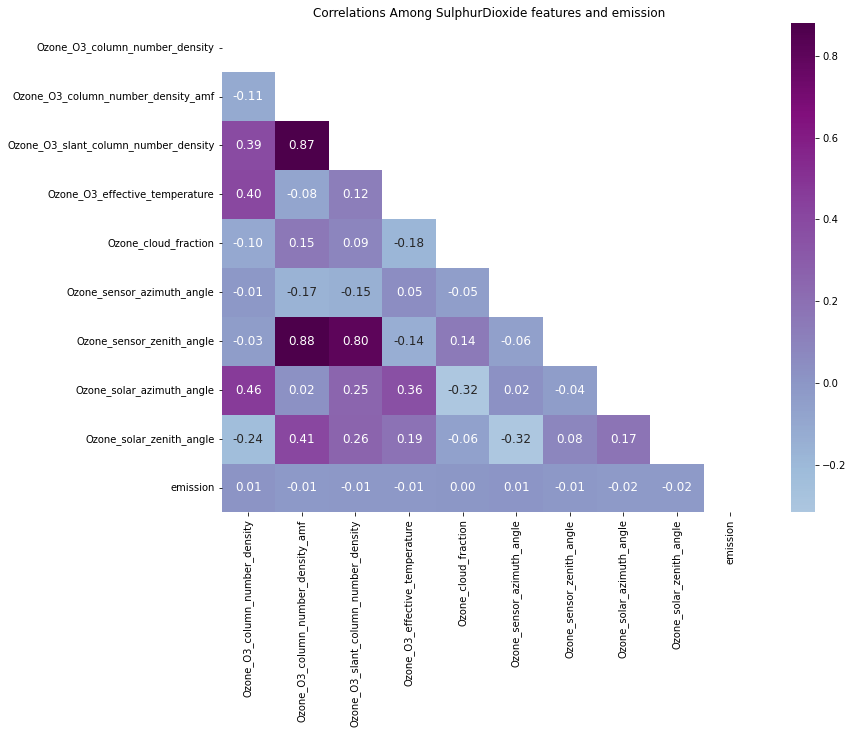

In [25]:
corr_mat = train_df[['Ozone_O3_column_number_density',
                  'Ozone_O3_column_number_density_amf',
                  'Ozone_O3_slant_column_number_density',
                  'Ozone_O3_effective_temperature',
                  'Ozone_cloud_fraction',
                  'Ozone_sensor_azimuth_angle',
                  'Ozone_sensor_zenith_angle',
                  'Ozone_solar_azimuth_angle',
                  'Ozone_solar_zenith_angle', 'emission']].corr()
data_mask = np.triu(np.ones_like(corr_mat, dtype=bool))
f, ax = plt.subplots(figsize = (12, 9))
sns.heatmap(corr_mat, annot = True, cmap = 'BuPu', fmt = '.2f', center = 0,
            annot_kws = {'size': 12}, mask = data_mask).set_title('Correlations Among SulphurDioxide features and emission');

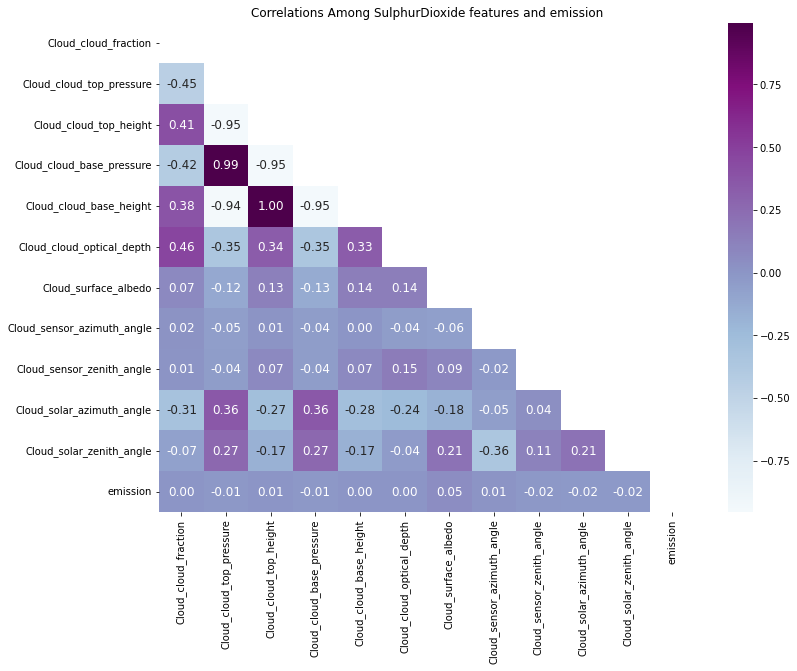

In [26]:
corr_mat = train_df[['Cloud_cloud_fraction',
                  'Cloud_cloud_top_pressure',
                  'Cloud_cloud_top_height',
                  'Cloud_cloud_base_pressure',
                  'Cloud_cloud_base_height',
                  'Cloud_cloud_optical_depth',
                  'Cloud_surface_albedo',
                  'Cloud_sensor_azimuth_angle',
                  'Cloud_sensor_zenith_angle',
                  'Cloud_solar_azimuth_angle',
                  'Cloud_solar_zenith_angle', 'emission']].corr()
data_mask = np.triu(np.ones_like(corr_mat, dtype=bool))
f, ax = plt.subplots(figsize = (12, 9))
sns.heatmap(corr_mat, annot = True, cmap = 'BuPu', fmt = '.2f', center = 0,
            annot_kws = {'size': 12}, mask = data_mask).set_title('Correlations Among SulphurDioxide features and emission');

* from above analysis that they are not correlated 

In [27]:
test_df = pd.read_csv('test.csv')

In [28]:
test_df.shape

(24353, 75)

In [29]:
test_df.describe().T

,count,mean,std,min,25%,50%,75%,max
latitude,24353.0,-1.891072,0.694532,-3.299000e+00,-2.451000,-1.882000,-1.303000,-0.510000
longitude,24353.0,29.880155,0.810387,2.822800e+01,29.262000,29.883000,30.471000,31.532000
year,24353.0,2022.000000,0.000000,2.022000e+03,2022.000000,2022.000000,2022.000000,2022.000000
week_no,24353.0,24.000000,14.142426,0.000000e+00,12.000000,24.000000,36.000000,48.000000
SulphurDioxide_SO2_column_number_density,18211.0,0.000014,0.000234,-9.771670e-04,-0.000122,0.000007,0.000137,0.004110
SulphurDioxide_SO2_column_number_density_amf,18211.0,0.792570,0.168043,3.398448e-01,0.678384,0.763307,0.872586,1.696826
SulphurDioxide_SO2_slant_column_number_density,18211.0,0.000009,0.000170,-7.745239e-04,-0.000094,0.000004,0.000104,0.002701
SulphurDioxide_cloud_fraction,18211.0,0.139218,0.079865,0.000000e+00,0.078934,0.138999,0.200819,0.299973
SulphurDioxide_sensor_azimuth_angle,18211.0,9.298052,67.148199,-1.068099e+02,-41.627297,16.857963,73.664560,157.503026
SulphurDioxide_sensor_zenith_angle,18211.0,36.174307,14.156478,9.960555e-02,26.577654,37.310447,45.972595,66.243271


In [30]:
100*(test_df.isnull().sum().sort_values(ascending=False)/test_df.shape[0])

UvAerosolLayerHeight_aerosol_pressure                       91.405576
UvAerosolLayerHeight_aerosol_optical_depth                  91.405576
UvAerosolLayerHeight_sensor_zenith_angle                    91.405576
UvAerosolLayerHeight_sensor_azimuth_angle                   91.405576
UvAerosolLayerHeight_aerosol_height                         91.405576
UvAerosolLayerHeight_solar_zenith_angle                     91.405576
UvAerosolLayerHeight_solar_azimuth_angle                    91.405576
SulphurDioxide_sensor_zenith_angle                          25.220712
SulphurDioxide_SO2_column_number_density_15km               25.220712
SulphurDioxide_solar_azimuth_angle                          25.220712
SulphurDioxide_solar_zenith_angle                           25.220712
SulphurDioxide_sensor_azimuth_angle                         25.220712
SulphurDioxide_cloud_fraction                               25.220712
SulphurDioxide_SO2_slant_column_number_density              25.220712
SulphurDioxide_SO2_c

* similar percentage of misssing values of are seen in the test dataset as well
* There is UV Aerosol missing percentages are very high so we can drop them also the data drift is very high that is another reason to drop them

In [31]:
np.array_equal(test_df[['latitude', 'longitude']].drop_duplicates(subset=['latitude', 'longitude']).values,
               train_df[['latitude', 'longitude']].drop_duplicates(subset=['latitude', 'longitude']).values)

True

* Our test and training datasetsimilar locations

# Base model without any machine learning 
### A model whose accuracy is below this model is simply unacceptable

In [32]:
train_df['location'] = [str(train_df['latitude'][i]) + '-' + str(train_df['longitude'][i]) for i in range(0,train_df.shape[0])]

test_df['location'] = [str(test_df['latitude'][i]) + '-' + str(test_df['longitude'][i]) for i in range(0,test_df.shape[0])]

train_df['location'] = train_df['location'].astype('category')
test_df['location'] = test_df['location'].astype('category')

train_res = pd.DataFrame(train_df.groupby(['location','week_no'])['emission'].mean()).reset_index()

In [33]:
train_df

,latitude,longitude,year,week_no,SulphurDioxide_SO2_column_number_density,SulphurDioxide_SO2_column_number_density_amf,SulphurDioxide_SO2_slant_column_number_density,SulphurDioxide_cloud_fraction,SulphurDioxide_sensor_azimuth_angle,SulphurDioxide_sensor_zenith_angle,SulphurDioxide_solar_azimuth_angle,SulphurDioxide_solar_zenith_angle,SulphurDioxide_SO2_column_number_density_15km,CarbonMonoxide_CO_column_number_density,CarbonMonoxide_H2O_column_number_density,CarbonMonoxide_cloud_height,CarbonMonoxide_sensor_altitude,CarbonMonoxide_sensor_azimuth_angle,CarbonMonoxide_sensor_zenith_angle,CarbonMonoxide_solar_azimuth_angle,CarbonMonoxide_solar_zenith_angle,NitrogenDioxide_NO2_column_number_density,NitrogenDioxide_tropospheric_NO2_column_number_density,NitrogenDioxide_stratospheric_NO2_column_number_density,NitrogenDioxide_NO2_slant_column_number_density,NitrogenDioxide_tropopause_pressure,NitrogenDioxide_absorbing_aerosol_index,NitrogenDioxide_cloud_fraction,NitrogenDioxide_sensor_altitude,NitrogenDioxide_sensor_azimuth_angle,NitrogenDioxide_sensor_zenith_angle,NitrogenDioxide_solar_azimuth_angle,NitrogenDioxide_solar_zenith_angle,Formaldehyde_tropospheric_HCHO_column_number_density,Formaldehyde_tropospheric_HCHO_column_number_density_amf,Formaldehyde_HCHO_slant_column_number_density,Formaldehyde_cloud_fraction,Formaldehyde_solar_zenith_angle,Formaldehyde_solar_azimuth_angle,Formaldehyde_sensor_zenith_angle,Formaldehyde_sensor_azimuth_angle,UvAerosolIndex_absorbing_aerosol_index,UvAerosolIndex_sensor_altitude,UvAerosolIndex_sensor_azimuth_angle,UvAerosolIndex_sensor_zenith_angle,UvAerosolIndex_solar_azimuth_angle,UvAerosolIndex_solar_zenith_angle,Ozone_O3_column_number_density,Ozone_O3_column_number_density_amf,Ozone_O3_slant_column_number_density,Ozone_O3_effective_temperature,Ozone_cloud_fraction,Ozone_sensor_azimuth_angle,Ozone_sensor_zenith_angle,Ozone_solar_azimuth_angle,Ozone_solar_zenith_angle,UvAerosolLayerHeight_aerosol_height,UvAerosolLayerHeight_aerosol_pressure,UvAerosolLayerHeight_aerosol_optical_depth,UvAerosolLayerHeight_sensor_zenith_angle,UvAerosolLayerHeight_sensor_azimuth_angle,UvAerosolLayerHeight_solar_azimuth_angle,UvAerosolLayerHeight_solar_zenith_angle,Cloud_cloud_fraction,Cloud_cloud_top_pressure,Cloud_cloud_top_height,Cloud_cloud_base_pressure,Cloud_cloud_base_height,Cloud_cloud_optical_depth,Cloud_surface_albedo,Cloud_sensor_azimuth_angle,Cloud_sensor_zenith_angle,Cloud_solar_azimuth_angle,Cloud_solar_zenith_angle,emission,location
ID_LAT_LON_YEAR_WEEK,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
ID_-0.510_29.290_2019_00,-0.510,29.290,2019,0,-0.000108,0.603019,-0.000065,0.255668,-98.593887,50.843559,-130.050797,35.874496,-0.000027,0.035370,1589.024536,4061.098145,829530.500000,71.111977,52.775928,-149.875565,25.965214,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000117,0.863230,0.000038,0.255668,35.874496,-130.050797,50.843559,-98.593887,-1.280761,829864.546875,-12.628979,35.632416,-138.786446,30.752128,0.115927,2.506609,0.295663,225.731144,0.595473,-12.628979,35.632416,-138.786446,30.752128,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.595473,53534.732422,3664.436218,61085.809570,2615.120483,15.568533,0.272292,-12.628986,35.632416,-138.786423,30.752140,3.750994,-0.51-29.29
ID_-0.510_29.290_2019_01,-0.510,29.290,2019,1,0.000021,0.728214,0.000014,0.130988,16.592861,39.137194,-140.874435,28.965133,0.000012,0.036526,1772.574405,1869.040414,829787.287130,-1.019594,38.982368,-140.158048,29.562000,0.000047,1.639765e-05,0.000030,0.000093,7311.869141,-1.935386,0.067038,829859.960368,5.471037,35.265195,-138.343908,30.054262,0.000170,1.172826,0.000143,0.200754,29.071781,-141.814827,43.050213,4.678839,-1.548119,829747.856973,16.152492,43.485327,-142.786141,28.573627,0.116775,2.657704,0.315733,226.172170,0.175166,24.464335,42.596541,-143.097868,28.213655,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.213608,63790.296241,3651.190311,66969.478735,3174.572424,8.690601,0.256830,30.359375,39.557633,-145.183930,27.251

In [34]:
train_res

,location,week_no,emission
0,-0.51-29.29,0,3.608051
1,-0.51-29.29,1,4.016319
2,-0.51-29.29,2,4.138755
3,-0.51-29.29,3,4.184737
4,-0.51-29.29,4,4.247569
...,...,...,...
26336,-3.299-30.301,48,28.759248
26337,-3.299-30.301,49,28.446492
26338,-3.299-30.301,50,28.776534
26339,-3.299-30.301,51,27.027759


In [35]:
test_res = test_df[['ID_LAT_LON_YEAR_WEEK','location','week_no']].copy()
test_res

,ID_LAT_LON_YEAR_WEEK,location,week_no
0,ID_-0.510_29.290_2022_00,-0.51-29.29,0
1,ID_-0.510_29.290_2022_01,-0.51-29.29,1
2,ID_-0.510_29.290_2022_02,-0.51-29.29,2
3,ID_-0.510_29.290_2022_03,-0.51-29.29,3
4,ID_-0.510_29.290_2022_04,-0.51-29.29,4
...,...,...,...
24348,ID_-3.299_30.301_2022_44,-3.299-30.301,44
24349,ID_-3.299_30.301_2022_45,-3.299-30.301,45
24350,ID_-3.299_30.301_2022_46,-3.299-30.301,46
24351,ID_-3.299_30.301_2022_47,-3.299-30.301,47


In [36]:
test_res = pd.merge(test_res,train_res,on=['location','week_no'],how = 'left')

In [37]:
test_res

,ID_LAT_LON_YEAR_WEEK,location,week_no,emission
0,ID_-0.510_29.290_2022_00,-0.51-29.29,0,3.608051
1,ID_-0.510_29.290_2022_01,-0.51-29.29,1,4.016319
2,ID_-0.510_29.290_2022_02,-0.51-29.29,2,4.138755
3,ID_-0.510_29.290_2022_03,-0.51-29.29,3,4.184737
4,ID_-0.510_29.290_2022_04,-0.51-29.29,4,4.247569
...,...,...,...,...
24348,ID_-3.299_30.301_2022_44,-3.299-30.301,44,28.725407
24349,ID_-3.299_30.301_2022_45,-3.299-30.301,45,29.048892
24350,ID_-3.299_30.301_2022_46,-3.299-30.301,46,29.252211
24351,ID_-3.299_30.301_2022_47,-3.299-30.301,47,29.794027


In [38]:
test_res.drop(columns=['location','week_no'],axis=1,inplace=True)

In [39]:
test_res

,ID_LAT_LON_YEAR_WEEK,emission
0,ID_-0.510_29.290_2022_00,3.608051
1,ID_-0.510_29.290_2022_01,4.016319
2,ID_-0.510_29.290_2022_02,4.138755
3,ID_-0.510_29.290_2022_03,4.184737
4,ID_-0.510_29.290_2022_04,4.247569
...,...,...
24348,ID_-3.299_30.301_2022_44,28.725407
24349,ID_-3.299_30.301_2022_45,29.048892
24350,ID_-3.299_30.301_2022_46,29.252211
24351,ID_-3.299_30.301_2022_47,29.794027


# Feature Engineering

In [40]:
train_df['Date'] = pd.to_datetime(train_df['year'].astype(str)+'-'+train_df['week_no'].astype(str)+'-1',
                                 format='%Y-%W-%w')
train_df

,latitude,longitude,year,week_no,SulphurDioxide_SO2_column_number_density,SulphurDioxide_SO2_column_number_density_amf,SulphurDioxide_SO2_slant_column_number_density,SulphurDioxide_cloud_fraction,SulphurDioxide_sensor_azimuth_angle,SulphurDioxide_sensor_zenith_angle,SulphurDioxide_solar_azimuth_angle,SulphurDioxide_solar_zenith_angle,SulphurDioxide_SO2_column_number_density_15km,CarbonMonoxide_CO_column_number_density,CarbonMonoxide_H2O_column_number_density,CarbonMonoxide_cloud_height,CarbonMonoxide_sensor_altitude,CarbonMonoxide_sensor_azimuth_angle,CarbonMonoxide_sensor_zenith_angle,CarbonMonoxide_solar_azimuth_angle,CarbonMonoxide_solar_zenith_angle,NitrogenDioxide_NO2_column_number_density,NitrogenDioxide_tropospheric_NO2_column_number_density,NitrogenDioxide_stratospheric_NO2_column_number_density,NitrogenDioxide_NO2_slant_column_number_density,NitrogenDioxide_tropopause_pressure,NitrogenDioxide_absorbing_aerosol_index,NitrogenDioxide_cloud_fraction,NitrogenDioxide_sensor_altitude,NitrogenDioxide_sensor_azimuth_angle,NitrogenDioxide_sensor_zenith_angle,NitrogenDioxide_solar_azimuth_angle,NitrogenDioxide_solar_zenith_angle,Formaldehyde_tropospheric_HCHO_column_number_density,Formaldehyde_tropospheric_HCHO_column_number_density_amf,Formaldehyde_HCHO_slant_column_number_density,Formaldehyde_cloud_fraction,Formaldehyde_solar_zenith_angle,Formaldehyde_solar_azimuth_angle,Formaldehyde_sensor_zenith_angle,Formaldehyde_sensor_azimuth_angle,UvAerosolIndex_absorbing_aerosol_index,UvAerosolIndex_sensor_altitude,UvAerosolIndex_sensor_azimuth_angle,UvAerosolIndex_sensor_zenith_angle,UvAerosolIndex_solar_azimuth_angle,UvAerosolIndex_solar_zenith_angle,Ozone_O3_column_number_density,Ozone_O3_column_number_density_amf,Ozone_O3_slant_column_number_density,Ozone_O3_effective_temperature,Ozone_cloud_fraction,Ozone_sensor_azimuth_angle,Ozone_sensor_zenith_angle,Ozone_solar_azimuth_angle,Ozone_solar_zenith_angle,UvAerosolLayerHeight_aerosol_height,UvAerosolLayerHeight_aerosol_pressure,UvAerosolLayerHeight_aerosol_optical_depth,UvAerosolLayerHeight_sensor_zenith_angle,UvAerosolLayerHeight_sensor_azimuth_angle,UvAerosolLayerHeight_solar_azimuth_angle,UvAerosolLayerHeight_solar_zenith_angle,Cloud_cloud_fraction,Cloud_cloud_top_pressure,Cloud_cloud_top_height,Cloud_cloud_base_pressure,Cloud_cloud_base_height,Cloud_cloud_optical_depth,Cloud_surface_albedo,Cloud_sensor_azimuth_angle,Cloud_sensor_zenith_angle,Cloud_solar_azimuth_angle,Cloud_solar_zenith_angle,emission,location,Date
ID_LAT_LON_YEAR_WEEK,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
ID_-0.510_29.290_2019_00,-0.510,29.290,2019,0,-0.000108,0.603019,-0.000065,0.255668,-98.593887,50.843559,-130.050797,35.874496,-0.000027,0.035370,1589.024536,4061.098145,829530.500000,71.111977,52.775928,-149.875565,25.965214,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000117,0.863230,0.000038,0.255668,35.874496,-130.050797,50.843559,-98.593887,-1.280761,829864.546875,-12.628979,35.632416,-138.786446,30.752128,0.115927,2.506609,0.295663,225.731144,0.595473,-12.628979,35.632416,-138.786446,30.752128,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.595473,53534.732422,3664.436218,61085.809570,2615.120483,15.568533,0.272292,-12.628986,35.632416,-138.786423,30.752140,3.750994,-0.51-29.29,2018-12-31
ID_-0.510_29.290_2019_01,-0.510,29.290,2019,1,0.000021,0.728214,0.000014,0.130988,16.592861,39.137194,-140.874435,28.965133,0.000012,0.036526,1772.574405,1869.040414,829787.287130,-1.019594,38.982368,-140.158048,29.562000,0.000047,1.639765e-05,0.000030,0.000093,7311.869141,-1.935386,0.067038,829859.960368,5.471037,35.265195,-138.343908,30.054262,0.000170,1.172826,0.000143,0.200754,29.071781,-141.814827,43.050213,4.678839,-1.548119,829747.856973,16.152492,43.485327,-142.786141,28.573627,0.116775,2.657704,0.315733,226.172170,0.175166,24.464335,42.596541,-143.097868,28.213655,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.213608,63790.296241,3651.190311,66969.478735,3174.572424,8.690601,0.256830,30.359375,39.557633,-

* The reason -1 is used in the concatenated string is that the %w format code represents the day of the week where Monday is represented by 1. However, when you're constructing a date using week numbers, it's common to consider Monday as the first day of the week. By appending -1 to the string, you ensure that the date you construct corresponds to the Monday of the specified week. Without this adjustment, pd.to_datetime() would raise an error because it would interpret the day as Sunday (0) by default.So, the entire code snippet helps create a 'date' column in the DataFrame that represents the first day (Monday) of the specified week and year, allowing for easier date-based analysis and visualization.







In [41]:
train_df.drop(columns=['UvAerosolLayerHeight_aerosol_pressure',
                    'UvAerosolLayerHeight_solar_zenith_angle',
                    'UvAerosolLayerHeight_aerosol_height',
                    'UvAerosolLayerHeight_aerosol_optical_depth',
                    'UvAerosolLayerHeight_sensor_zenith_angle', 'UvAerosolLayerHeight_sensor_azimuth_angle',
                    'UvAerosolLayerHeight_solar_azimuth_angle'], inplace=True)

In [42]:
# Calculate the average monthly emission for non-virus years (2019 and 2021)
avg_emi_non_virus_years = train_df[train_df['year'].isin((2019,
                                                          2021))].groupby('week_no')['emission'].mean()

# Calculate the average monthly emission for virus year (2020)
avg_emi_virus_year = train_df[train_df['year']==2020].groupby('week_no')['emission'].mean()

ratio_weeks = avg_emi_non_virus_years/avg_emi_virus_year

train_df.loc[train_df['year']==2020,'emission'] *= train_df['week_no'].map(ratio_weeks)

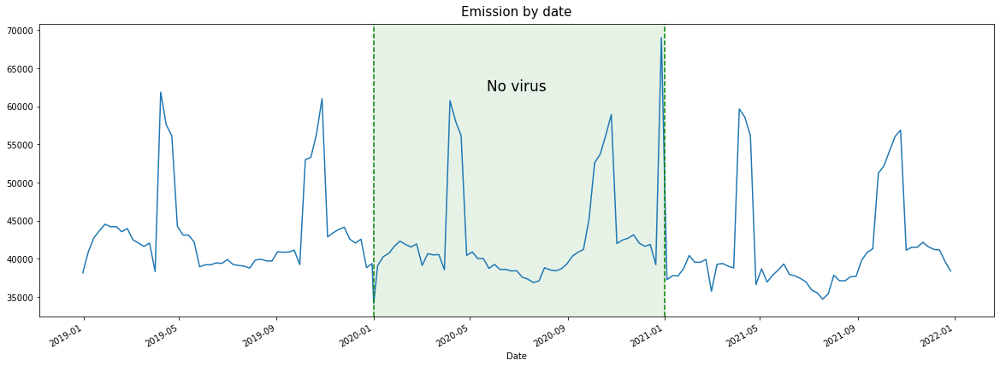

In [43]:
train_df.groupby(['Date'])['emission'].sum().plot(kind='line', figsize=(20, 7), xlabel='Date')

plt.axvspan(pd.Timestamp('2020-01-01'), pd.Timestamp('2021-01-01'), color='green', alpha=0.1)
plt.axvline(pd.Timestamp('2020-01-01'), linestyle = "--", color='green')
plt.axvline(pd.Timestamp('2021-01-01'), linestyle = "--", color='green')

plt.text(pd.Timestamp('2020-05-22'), 62000, "No virus", size = 17)

plt.title('Emission by date', size=15, pad=10)
plt.show()

In [44]:
# Let's fix the large spike in the last week of 2020. It's an outlier.
train_df.loc[(train_df['year']==2020)&(train_df['week_no']==52),
             'emission'] = np.power(train_df.loc[(train_df['year']==2020)&(train_df['week_no']==52),'emission'],1/1.5)

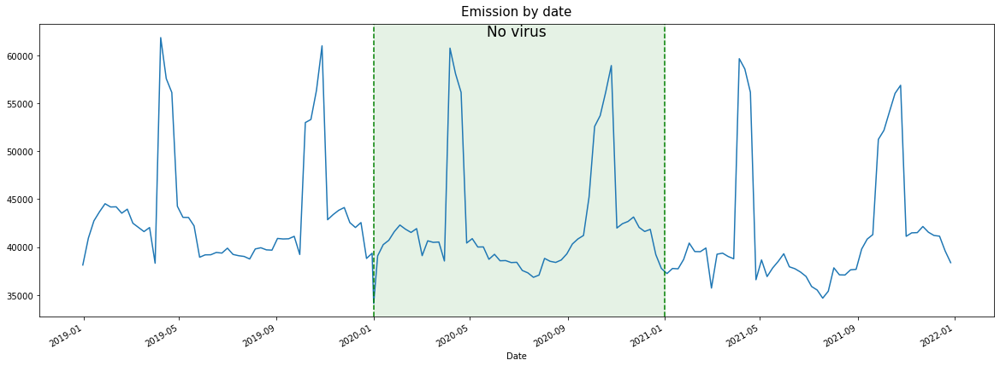

In [45]:
train_df.groupby(['Date'])['emission'].sum().plot(kind='line', figsize=(20, 7), xlabel='Date')

plt.axvspan(pd.Timestamp('2020-01-01'), pd.Timestamp('2021-01-01'), color='green', alpha=0.1)
plt.axvline(pd.Timestamp('2020-01-01'), linestyle = "--", color='green')
plt.axvline(pd.Timestamp('2021-01-01'), linestyle = "--", color='green')

plt.text(pd.Timestamp('2020-05-22'), 62000, "No virus", size = 17)

plt.title('Emission by date', size=15, pad=10)
plt.show()

* this code is identifying the outlier emissions in the last week of 2020, and it's applying a power transformation (square root in this case) to adjust the value, likely to bring it closer to the other values in the dataset. This can help in making the data more suitable for analysis and modeling by reducing the impact of extreme values.

* why 1/1.5?
* 1/1.5: This is the exponent used in the power transformation. Raising a value to the power of 1/1.5 is equivalent to taking the square root of the value, which is a common transformation to mitigate the impact of outliers. Just hit and trial best value was given by this only started with 1/2

# Seasons
* Overall Rwanda's four climactic seasons are represented through the long rainy season: March to May, and short rainy season: September to November. These seasons alternate with the long dry season: June to August, and short dry season: December to February. Using that knowledge we will add season feature with seasons labeled from 1 to 4.

In [46]:
import datetime as dt

In [47]:
train_df['holidays'] = (train_df['week_no'].isin([0, 51, 12, 30]))

In [48]:
test_df['holidays'] = (test_df['week_no'].isin([0, 51, 12, 30]))

In [49]:
train_df

,latitude,longitude,year,week_no,SulphurDioxide_SO2_column_number_density,SulphurDioxide_SO2_column_number_density_amf,SulphurDioxide_SO2_slant_column_number_density,SulphurDioxide_cloud_fraction,SulphurDioxide_sensor_azimuth_angle,SulphurDioxide_sensor_zenith_angle,SulphurDioxide_solar_azimuth_angle,SulphurDioxide_solar_zenith_angle,SulphurDioxide_SO2_column_number_density_15km,CarbonMonoxide_CO_column_number_density,CarbonMonoxide_H2O_column_number_density,CarbonMonoxide_cloud_height,CarbonMonoxide_sensor_altitude,CarbonMonoxide_sensor_azimuth_angle,CarbonMonoxide_sensor_zenith_angle,CarbonMonoxide_solar_azimuth_angle,CarbonMonoxide_solar_zenith_angle,NitrogenDioxide_NO2_column_number_density,NitrogenDioxide_tropospheric_NO2_column_number_density,NitrogenDioxide_stratospheric_NO2_column_number_density,NitrogenDioxide_NO2_slant_column_number_density,NitrogenDioxide_tropopause_pressure,NitrogenDioxide_absorbing_aerosol_index,NitrogenDioxide_cloud_fraction,NitrogenDioxide_sensor_altitude,NitrogenDioxide_sensor_azimuth_angle,NitrogenDioxide_sensor_zenith_angle,NitrogenDioxide_solar_azimuth_angle,NitrogenDioxide_solar_zenith_angle,Formaldehyde_tropospheric_HCHO_column_number_density,Formaldehyde_tropospheric_HCHO_column_number_density_amf,Formaldehyde_HCHO_slant_column_number_density,Formaldehyde_cloud_fraction,Formaldehyde_solar_zenith_angle,Formaldehyde_solar_azimuth_angle,Formaldehyde_sensor_zenith_angle,Formaldehyde_sensor_azimuth_angle,UvAerosolIndex_absorbing_aerosol_index,UvAerosolIndex_sensor_altitude,UvAerosolIndex_sensor_azimuth_angle,UvAerosolIndex_sensor_zenith_angle,UvAerosolIndex_solar_azimuth_angle,UvAerosolIndex_solar_zenith_angle,Ozone_O3_column_number_density,Ozone_O3_column_number_density_amf,Ozone_O3_slant_column_number_density,Ozone_O3_effective_temperature,Ozone_cloud_fraction,Ozone_sensor_azimuth_angle,Ozone_sensor_zenith_angle,Ozone_solar_azimuth_angle,Ozone_solar_zenith_angle,Cloud_cloud_fraction,Cloud_cloud_top_pressure,Cloud_cloud_top_height,Cloud_cloud_base_pressure,Cloud_cloud_base_height,Cloud_cloud_optical_depth,Cloud_surface_albedo,Cloud_sensor_azimuth_angle,Cloud_sensor_zenith_angle,Cloud_solar_azimuth_angle,Cloud_solar_zenith_angle,emission,location,Date,holidays
ID_LAT_LON_YEAR_WEEK,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
ID_-0.510_29.290_2019_00,-0.510,29.290,2019,0,-0.000108,0.603019,-0.000065,0.255668,-98.593887,50.843559,-130.050797,35.874496,-0.000027,0.035370,1589.024536,4061.098145,829530.500000,71.111977,52.775928,-149.875565,25.965214,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000117,0.863230,0.000038,0.255668,35.874496,-130.050797,50.843559,-98.593887,-1.280761,829864.546875,-12.628979,35.632416,-138.786446,30.752128,0.115927,2.506609,0.295663,225.731144,0.595473,-12.628979,35.632416,-138.786446,30.752128,0.595473,53534.732422,3664.436218,61085.809570,2615.120483,15.568533,0.272292,-12.628986,35.632416,-138.786423,30.752140,3.750994,-0.51-29.29,2018-12-31,True
ID_-0.510_29.290_2019_01,-0.510,29.290,2019,1,0.000021,0.728214,0.000014,0.130988,16.592861,39.137194,-140.874435,28.965133,0.000012,0.036526,1772.574405,1869.040414,829787.287130,-1.019594,38.982368,-140.158048,29.562000,0.000047,1.639765e-05,0.000030,0.000093,7311.869141,-1.935386,0.067038,829859.960368,5.471037,35.265195,-138.343908,30.054262,0.000170,1.172826,0.000143,0.200754,29.071781,-141.814827,43.050213,4.678839,-1.548119,829747.856973,16.152492,43.485327,-142.786141,28.573627,0.116775,2.657704,0.315733,226.172170,0.175166,24.464335,42.596541,-143.097868,28.213655,0.213608,63790.296241,3651.190311,66969.478735,3174.572424,8.690601,0.256830,30.359375,39.557633,-145.183930,27.251779,4.025176,-0.51-29.29,2019-01-07,False
ID_-0.510_29.290_2019_02,-0.510,29.290,2019,2,0.000514,0.748199,0.000385,0.110018,72.795837,52.868816,-150.191757,23.206415,0.000154,0.035338,2703.236800,2809.138386,829883.828686,-54.801144,52.344378,-133.683714,31.586838,0.000031,4.267369e-07,0.000030,0.000080,7311.86

# Cyclic features

In [50]:
train_df['week_no_sin'] = np.sin(train_df['week_no']*(2*np.pi/53))
train_df['week_no_cos'] = np.cos(train_df['week_no']*(2*np.pi/53))

test_df['week_no_sin'] = np.sin(test_df['week_no']*(2*np.pi/53))
test_df['week_no_cos'] = np.cos(test_df['week_no']*(2*np.pi/53))

In [51]:
train_df

,latitude,longitude,year,week_no,SulphurDioxide_SO2_column_number_density,SulphurDioxide_SO2_column_number_density_amf,SulphurDioxide_SO2_slant_column_number_density,SulphurDioxide_cloud_fraction,SulphurDioxide_sensor_azimuth_angle,SulphurDioxide_sensor_zenith_angle,SulphurDioxide_solar_azimuth_angle,SulphurDioxide_solar_zenith_angle,SulphurDioxide_SO2_column_number_density_15km,CarbonMonoxide_CO_column_number_density,CarbonMonoxide_H2O_column_number_density,CarbonMonoxide_cloud_height,CarbonMonoxide_sensor_altitude,CarbonMonoxide_sensor_azimuth_angle,CarbonMonoxide_sensor_zenith_angle,CarbonMonoxide_solar_azimuth_angle,CarbonMonoxide_solar_zenith_angle,NitrogenDioxide_NO2_column_number_density,NitrogenDioxide_tropospheric_NO2_column_number_density,NitrogenDioxide_stratospheric_NO2_column_number_density,NitrogenDioxide_NO2_slant_column_number_density,NitrogenDioxide_tropopause_pressure,NitrogenDioxide_absorbing_aerosol_index,NitrogenDioxide_cloud_fraction,NitrogenDioxide_sensor_altitude,NitrogenDioxide_sensor_azimuth_angle,NitrogenDioxide_sensor_zenith_angle,NitrogenDioxide_solar_azimuth_angle,NitrogenDioxide_solar_zenith_angle,Formaldehyde_tropospheric_HCHO_column_number_density,Formaldehyde_tropospheric_HCHO_column_number_density_amf,Formaldehyde_HCHO_slant_column_number_density,Formaldehyde_cloud_fraction,Formaldehyde_solar_zenith_angle,Formaldehyde_solar_azimuth_angle,Formaldehyde_sensor_zenith_angle,Formaldehyde_sensor_azimuth_angle,UvAerosolIndex_absorbing_aerosol_index,UvAerosolIndex_sensor_altitude,UvAerosolIndex_sensor_azimuth_angle,UvAerosolIndex_sensor_zenith_angle,UvAerosolIndex_solar_azimuth_angle,UvAerosolIndex_solar_zenith_angle,Ozone_O3_column_number_density,Ozone_O3_column_number_density_amf,Ozone_O3_slant_column_number_density,Ozone_O3_effective_temperature,Ozone_cloud_fraction,Ozone_sensor_azimuth_angle,Ozone_sensor_zenith_angle,Ozone_solar_azimuth_angle,Ozone_solar_zenith_angle,Cloud_cloud_fraction,Cloud_cloud_top_pressure,Cloud_cloud_top_height,Cloud_cloud_base_pressure,Cloud_cloud_base_height,Cloud_cloud_optical_depth,Cloud_surface_albedo,Cloud_sensor_azimuth_angle,Cloud_sensor_zenith_angle,Cloud_solar_azimuth_angle,Cloud_solar_zenith_angle,emission,location,Date,holidays,week_no_sin,week_no_cos
ID_LAT_LON_YEAR_WEEK,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
ID_-0.510_29.290_2019_00,-0.510,29.290,2019,0,-0.000108,0.603019,-0.000065,0.255668,-98.593887,50.843559,-130.050797,35.874496,-0.000027,0.035370,1589.024536,4061.098145,829530.500000,71.111977,52.775928,-149.875565,25.965214,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000117,0.863230,0.000038,0.255668,35.874496,-130.050797,50.843559,-98.593887,-1.280761,829864.546875,-12.628979,35.632416,-138.786446,30.752128,0.115927,2.506609,0.295663,225.731144,0.595473,-12.628979,35.632416,-138.786446,30.752128,0.595473,53534.732422,3664.436218,61085.809570,2615.120483,15.568533,0.272292,-12.628986,35.632416,-138.786423,30.752140,3.750994,-0.51-29.29,2018-12-31,True,0.000000,1.000000
ID_-0.510_29.290_2019_01,-0.510,29.290,2019,1,0.000021,0.728214,0.000014,0.130988,16.592861,39.137194,-140.874435,28.965133,0.000012,0.036526,1772.574405,1869.040414,829787.287130,-1.019594,38.982368,-140.158048,29.562000,0.000047,1.639765e-05,0.000030,0.000093,7311.869141,-1.935386,0.067038,829859.960368,5.471037,35.265195,-138.343908,30.054262,0.000170,1.172826,0.000143,0.200754,29.071781,-141.814827,43.050213,4.678839,-1.548119,829747.856973,16.152492,43.485327,-142.786141,28.573627,0.116775,2.657704,0.315733,226.172170,0.175166,24.464335,42.596541,-143.097868,28.213655,0.213608,63790.296241,3651.190311,66969.478735,3174.572424,8.690601,0.256830,30.359375,39.557633,-145.183930,27.251779,4.025176,-0.51-29.29,2019-01-07,False,0.118273,0.992981
ID_-0.510_29.290_2019_02,-0.510,29.290,2019,2,0.000514,0.748199,0.000385,0.110018,72.795837,52.868816,-150.191757,23.206415,0.000154,0.035338,2703.236800,2809.138386,829883.828686,-54.801144,52.344378,-133.68

# Rotating Location
* The idea is to transform the spatial coordinates using rotation angles of 15 and 30 degrees to potentially capture more spatial relationships in the data. These transformations might help the machine learning model better understand and utilize the spatial information present in the dataset.

* The purpose of these transformations is to create new features that encode spatial relationships between the coordinates from different perspectives. This might be useful if certain spatial patterns or relationships are not easily captured using raw latitude and longitude values alone.

In [52]:

train_df['rot_15_x'] = (np.cos(np.radians(15)) * train_df['longitude']) + (np.sin(np.radians(15)) * train_df['latitude'])

train_df['rot_15_y'] = (np.cos(np.radians(15)) * train_df['latitude']) + (np.sin(np.radians(15)) * train_df['longitude'])

train_df['rot_30_x'] = (np.cos(np.radians(30)) * train_df['longitude']) + (np.sin(np.radians(30)) * train_df['latitude'])

train_df['rot_30_y'] = (np.cos(np.radians(30)) * train_df['latitude']) + (np.sin(np.radians(30)) * train_df['longitude'])

In [53]:
test_df['rot_15_x'] = (np.cos(np.radians(15)) * test_df['longitude']) + (np.sin(np.radians(15)) * test_df['latitude'])

test_df['rot_15_y'] = (np.cos(np.radians(15)) * test_df['latitude']) + (np.sin(np.radians(15)) * test_df['longitude'])

test_df['rot_30_x'] = (np.cos(np.radians(30)) * test_df['longitude']) + (np.sin(np.radians(30)) * test_df['latitude'])

test_df['rot_30_y'] = (np.cos(np.radians(30)) * test_df['latitude']) + (np.sin(np.radians(30)) * test_df['longitude'])

In [54]:
training_cols = ['latitude', 'longitude', 'year', 'week_no_sin',
                 'week_no_cos', 'holidays', 'rot_15_x', 'rot_15_y',
                 'rot_30_x', 'rot_30_y']

In [55]:
X_train = train_df.drop(columns='emission')
y = train_df['emission']

In [57]:
def missing_values_imputer(dataframe):
        df = dataframe.copy()

        symmetrical_cols_counter = 0
        skewed_cols_counter = 0
        categorical_cols_counter = 0
        
        grouped = df.groupby(['week_no', 'location'])

        for col in df.columns:

            if df[col].isnull().sum() != 0:

                if pd.api.types.is_numeric_dtype(df[col]): #Checking if numeric col
                    skewness = df[col].skew()

                    if -0.5 <= skewness <= 0.5:  # Symmetrical case
                        mean = grouped[col].transform('mean')
                        df[col] = df[col].fillna(mean) # Replacing with mean
                        symmetrical_cols_counter += 1

                    else:  # Negative or positive skewed case
                        median = grouped[col].transform('median')
                        df[col] = df[col].fillna(median.astype(df[col].dtype)) # Replacing with median
                        skewed_cols_counter += 1

                else: #For categorical col
                    mode = grouped[col].apply(lambda x: x.mode().iloc[0])
                    df[col] = df[col].fillna(mode) # Replacing with mode
                    categorical_cols_counter += 1
                    
        print(f'{symmetrical_cols_counter} symmetrical cols were replaced with smart mean.')
        print(f'{skewed_cols_counter} skewed cols were replaced with smart median.')
        print(f'{categorical_cols_counter} categorical cols were replaced with smart mode.')
        
        
        return df

In [58]:
X_train = missing_values_imputer(X_train)

45 symmetrical cols were replaced with smart mean.
18 skewed cols were replaced with smart median.
0 categorical cols were replaced with smart mode.


In [59]:
pipeline = make_pipeline(
    QuantileTransformer(output_distribution='normal', random_state=42),
    StandardScaler()
)

In [60]:
X_transformed = pipeline.fit_transform(X_train[training_cols])

In [61]:
X_transformed

array([[ 5.04248568, -0.6216676 , -1.22474487, ...,  1.65934546,
         0.17122573,  1.01499916],
       [ 5.04248568, -0.6216676 , -1.22474487, ...,  1.65934546,
         0.17122573,  1.01499916],
       [ 5.04248568, -0.6216676 , -1.22474487, ...,  1.65934546,
         0.17122573,  1.01499916],
       ...,
       [-5.04248621,  0.41373083,  1.22474487, ..., -1.80266575,
        -0.371468  , -1.13171111],
       [-5.04248621,  0.41373083,  1.22474487, ..., -1.80266575,
        -0.371468  , -1.13171111],
       [-5.04248621,  0.41373083,  1.22474487, ..., -1.80266575,
        -0.371468  , -1.13171111]])

In [62]:
X_transformed = pd.DataFrame(X_transformed,columns = pipeline.get_feature_names_out(),index=X_train.index)

In [63]:
X_transformed

,latitude,longitude,year,week_no_sin,week_no_cos,holidays,rot_15_x,rot_15_y,rot_30_x,rot_30_y
ID_LAT_LON_YEAR_WEEK,,,,,,,,,,
ID_-0.510_29.290_2019_00,5.042486,-0.621668,-1.224745,-1.380254e-12,3.527765,3.500000,-0.258540,1.659345,0.171226,1.014999
ID_-0.510_29.290_2019_01,5.042486,-0.621668,-1.224745,7.045284e-02,1.164104,-0.285714,-0.258540,1.659345,0.171226,1.014999
ID_-0.510_29.290_2019_02,5.042486,-0.621668,-1.224745,1.424934e-01,1.004047,-0.285714,-0.258540,1.659345,0.171226,1.014999
ID_-0.510_29.290_2019_03,5.042486,-0.621668,-1.224745,2.158849e-01,0.885386,-0.285714,-0.258540,1.659345,0.171226,1.014999
ID_-0.510_29.290_2019_04,5.042486,-0.621668,-1.224745,2.894000e-01,0.734614,-0.285714,-0.258540,1.659345,0.171226,1.014999
...,...,...,...,...,...,...,...,...,...,...
ID_-3.299_30.301_2021_48,-5.042486,0.413731,1.224745,-3.679479e-01,0.610185,-0.285714,0.024337,-1.802666,-0.371468,-1.131711
ID_-3.299_30.301_2021_49,-5.042486,0.413731,1.224745,-2.894000e-01,0.734614,-0.285714,0.024337,-1.802666,-0.371468,-1.131711
ID_-3.299_30.301_2021_50,-5.042486,0.413731,1.224745,-2.158849e-01,0.820660,-0.285714,0.024337,-1.802666,-0.371468,-1.131711


In [64]:
model = RandomForestRegressor(min_samples_leaf=6, random_state=42)

model.fit(X_transformed, y)

RandomForestRegressor(min_samples_leaf=6, random_state=42)

In [65]:
# 3 groups for 2019, 2020 and 2021
gkf = GroupKFold(3)

scores = -cross_val_score(model, X_transformed, y, scoring="neg_root_mean_squared_error", cv=gkf.split(X_transformed, y, groups=train_df['year']))

print(f'Training RMSE: {mean_squared_error(y, model.predict(X_transformed), squared=False):.2f}')
print(f"Cross validation RMSE: {scores.mean():.2f}")

Training RMSE: 14.98
Cross validation RMSE: 21.90


In [66]:
test_df.columns

Index(['ID_LAT_LON_YEAR_WEEK', 'latitude', 'longitude', 'year', 'week_no',
       'SulphurDioxide_SO2_column_number_density',
       'SulphurDioxide_SO2_column_number_density_amf',
       'SulphurDioxide_SO2_slant_column_number_density',
       'SulphurDioxide_cloud_fraction', 'SulphurDioxide_sensor_azimuth_angle',
       'SulphurDioxide_sensor_zenith_angle',
       'SulphurDioxide_solar_azimuth_angle',
       'SulphurDioxide_solar_zenith_angle',
       'SulphurDioxide_SO2_column_number_density_15km',
       'CarbonMonoxide_CO_column_number_density',
       'CarbonMonoxide_H2O_column_number_density',
       'CarbonMonoxide_cloud_height', 'CarbonMonoxide_sensor_altitude',
       'CarbonMonoxide_sensor_azimuth_angle',
       'CarbonMonoxide_sensor_zenith_angle',
       'CarbonMonoxide_solar_azimuth_angle',
       'CarbonMonoxide_solar_zenith_angle',
       'NitrogenDioxide_NO2_column_number_density',
       'NitrogenDioxide_tropospheric_NO2_column_number_density',
       'NitrogenDioxide

In [67]:
training_cols

['latitude',
 'longitude',
 'year',
 'week_no_sin',
 'week_no_cos',
 'holidays',
 'rot_15_x',
 'rot_15_y',
 'rot_30_x',
 'rot_30_y']

In [68]:
test_df['date'] = pd.to_datetime(test_df['year'].astype(str) + '-' + test_df['week_no'].astype(str) + '-1',
                                 format='%Y-%W-%w')

# Drop Uv Aerosol
test_df.drop(columns=['UvAerosolLayerHeight_aerosol_pressure',
                   'UvAerosolLayerHeight_solar_zenith_angle',
                   'UvAerosolLayerHeight_aerosol_height',
                   'UvAerosolLayerHeight_aerosol_optical_depth',
                   'UvAerosolLayerHeight_sensor_zenith_angle',
                   'UvAerosolLayerHeight_sensor_azimuth_angle',
                   'UvAerosolLayerHeight_solar_azimuth_angle'], inplace=True)

In [69]:
X_test = missing_values_imputer(test_df)

49 symmetrical cols were replaced with smart mean.
14 skewed cols were replaced with smart median.
0 categorical cols were replaced with smart mode.


In [70]:
X_test = pd.DataFrame(data=pipeline.transform(X_test[training_cols]),
                      columns=pipeline.get_feature_names_out(), index=X_test.index)

In [71]:
predictions = model.predict(X_test)
predictions

array([ 3.63376127,  3.92406302,  4.17062318, ..., 29.52182607,
       29.34603584, 28.8808064 ])

* Fixing predictions

In [72]:
predictions[predictions<0] = 0

mask = test_df.apply(lambda x: (x['latitude'], x['longitude']) in zero_emissions.index, axis=1)
predictions[mask] = 0

* multiplying predictions with 1.07 improves the leadership score

In [73]:
sample_submission = pd.read_csv('sample_submission.csv', index_col='ID_LAT_LON_YEAR_WEEK')


In [74]:
sample_submission

,emission
ID_LAT_LON_YEAR_WEEK,
ID_-0.510_29.290_2022_00,81.94
ID_-0.510_29.290_2022_01,81.94
ID_-0.510_29.290_2022_02,81.94
ID_-0.510_29.290_2022_03,81.94
ID_-0.510_29.290_2022_04,81.94
...,...
ID_-3.299_30.301_2022_44,81.94
ID_-3.299_30.301_2022_45,81.94
ID_-3.299_30.301_2022_46,81.94


In [75]:
sample_submission['emission'] = predictions * 1.07

In [76]:
sample_submission

,emission
ID_LAT_LON_YEAR_WEEK,
ID_-0.510_29.290_2022_00,3.888125
ID_-0.510_29.290_2022_01,4.198747
ID_-0.510_29.290_2022_02,4.462567
ID_-0.510_29.290_2022_03,4.467762
ID_-0.510_29.290_2022_04,4.501354
...,...
ID_-3.299_30.301_2022_44,31.666681
ID_-3.299_30.301_2022_45,31.659442
ID_-3.299_30.301_2022_46,31.588354


In [77]:
train_plot = train_df.copy(deep=True)

In [78]:
train_plot

,latitude,longitude,year,week_no,SulphurDioxide_SO2_column_number_density,SulphurDioxide_SO2_column_number_density_amf,SulphurDioxide_SO2_slant_column_number_density,SulphurDioxide_cloud_fraction,SulphurDioxide_sensor_azimuth_angle,SulphurDioxide_sensor_zenith_angle,SulphurDioxide_solar_azimuth_angle,SulphurDioxide_solar_zenith_angle,SulphurDioxide_SO2_column_number_density_15km,CarbonMonoxide_CO_column_number_density,CarbonMonoxide_H2O_column_number_density,CarbonMonoxide_cloud_height,CarbonMonoxide_sensor_altitude,CarbonMonoxide_sensor_azimuth_angle,CarbonMonoxide_sensor_zenith_angle,CarbonMonoxide_solar_azimuth_angle,CarbonMonoxide_solar_zenith_angle,NitrogenDioxide_NO2_column_number_density,NitrogenDioxide_tropospheric_NO2_column_number_density,NitrogenDioxide_stratospheric_NO2_column_number_density,NitrogenDioxide_NO2_slant_column_number_density,NitrogenDioxide_tropopause_pressure,NitrogenDioxide_absorbing_aerosol_index,NitrogenDioxide_cloud_fraction,NitrogenDioxide_sensor_altitude,NitrogenDioxide_sensor_azimuth_angle,NitrogenDioxide_sensor_zenith_angle,NitrogenDioxide_solar_azimuth_angle,NitrogenDioxide_solar_zenith_angle,Formaldehyde_tropospheric_HCHO_column_number_density,Formaldehyde_tropospheric_HCHO_column_number_density_amf,Formaldehyde_HCHO_slant_column_number_density,Formaldehyde_cloud_fraction,Formaldehyde_solar_zenith_angle,Formaldehyde_solar_azimuth_angle,Formaldehyde_sensor_zenith_angle,Formaldehyde_sensor_azimuth_angle,UvAerosolIndex_absorbing_aerosol_index,UvAerosolIndex_sensor_altitude,UvAerosolIndex_sensor_azimuth_angle,UvAerosolIndex_sensor_zenith_angle,UvAerosolIndex_solar_azimuth_angle,UvAerosolIndex_solar_zenith_angle,Ozone_O3_column_number_density,Ozone_O3_column_number_density_amf,Ozone_O3_slant_column_number_density,Ozone_O3_effective_temperature,Ozone_cloud_fraction,Ozone_sensor_azimuth_angle,Ozone_sensor_zenith_angle,Ozone_solar_azimuth_angle,Ozone_solar_zenith_angle,Cloud_cloud_fraction,Cloud_cloud_top_pressure,Cloud_cloud_top_height,Cloud_cloud_base_pressure,Cloud_cloud_base_height,Cloud_cloud_optical_depth,Cloud_surface_albedo,Cloud_sensor_azimuth_angle,Cloud_sensor_zenith_angle,Cloud_solar_azimuth_angle,Cloud_solar_zenith_angle,emission,location,Date,holidays,week_no_sin,week_no_cos,rot_15_x,rot_15_y,rot_30_x,rot_30_y
ID_LAT_LON_YEAR_WEEK,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
ID_-0.510_29.290_2019_00,-0.510,29.290,2019,0,-0.000108,0.603019,-0.000065,0.255668,-98.593887,50.843559,-130.050797,35.874496,-0.000027,0.035370,1589.024536,4061.098145,829530.500000,71.111977,52.775928,-149.875565,25.965214,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000117,0.863230,0.000038,0.255668,35.874496,-130.050797,50.843559,-98.593887,-1.280761,829864.546875,-12.628979,35.632416,-138.786446,30.752128,0.115927,2.506609,0.295663,225.731144,0.595473,-12.628979,35.632416,-138.786446,30.752128,0.595473,53534.732422,3664.436218,61085.809570,2615.120483,15.568533,0.272292,-12.628986,35.632416,-138.786423,30.752140,3.750994,-0.51-29.29,2018-12-31,True,0.000000,1.000000,28.159970,7.088188,25.110884,14.203327
ID_-0.510_29.290_2019_01,-0.510,29.290,2019,1,0.000021,0.728214,0.000014,0.130988,16.592861,39.137194,-140.874435,28.965133,0.000012,0.036526,1772.574405,1869.040414,829787.287130,-1.019594,38.982368,-140.158048,29.562000,0.000047,1.639765e-05,0.000030,0.000093,7311.869141,-1.935386,0.067038,829859.960368,5.471037,35.265195,-138.343908,30.054262,0.000170,1.172826,0.000143,0.200754,29.071781,-141.814827,43.050213,4.678839,-1.548119,829747.856973,16.152492,43.485327,-142.786141,28.573627,0.116775,2.657704,0.315733,226.172170,0.175166,24.464335,42.596541,-143.097868,28.213655,0.213608,63790.296241,3651.190311,66969.478735,3174.572424,8.690601,0.256830,30.359375,39.557633,-145.183930,27.251779,4.025176,-0.51-29.29,2019-01-07,False,0.118273,0.992981,28.159970,7.088188,25.110884,14.203327
ID_-0.510_29.290_2019_02,-0.510,29.290,2019,2,0.000514,0.748199,0.000385,0.110018,72.79583

In [82]:
test_df.set_index('ID_LAT_LON_YEAR_WEEK',drop=True,inplace=True)

In [83]:
test_df

,latitude,longitude,year,week_no,SulphurDioxide_SO2_column_number_density,SulphurDioxide_SO2_column_number_density_amf,SulphurDioxide_SO2_slant_column_number_density,SulphurDioxide_cloud_fraction,SulphurDioxide_sensor_azimuth_angle,SulphurDioxide_sensor_zenith_angle,SulphurDioxide_solar_azimuth_angle,SulphurDioxide_solar_zenith_angle,SulphurDioxide_SO2_column_number_density_15km,CarbonMonoxide_CO_column_number_density,CarbonMonoxide_H2O_column_number_density,CarbonMonoxide_cloud_height,CarbonMonoxide_sensor_altitude,CarbonMonoxide_sensor_azimuth_angle,CarbonMonoxide_sensor_zenith_angle,CarbonMonoxide_solar_azimuth_angle,CarbonMonoxide_solar_zenith_angle,NitrogenDioxide_NO2_column_number_density,NitrogenDioxide_tropospheric_NO2_column_number_density,NitrogenDioxide_stratospheric_NO2_column_number_density,NitrogenDioxide_NO2_slant_column_number_density,NitrogenDioxide_tropopause_pressure,NitrogenDioxide_absorbing_aerosol_index,NitrogenDioxide_cloud_fraction,NitrogenDioxide_sensor_altitude,NitrogenDioxide_sensor_azimuth_angle,NitrogenDioxide_sensor_zenith_angle,NitrogenDioxide_solar_azimuth_angle,NitrogenDioxide_solar_zenith_angle,Formaldehyde_tropospheric_HCHO_column_number_density,Formaldehyde_tropospheric_HCHO_column_number_density_amf,Formaldehyde_HCHO_slant_column_number_density,Formaldehyde_cloud_fraction,Formaldehyde_solar_zenith_angle,Formaldehyde_solar_azimuth_angle,Formaldehyde_sensor_zenith_angle,Formaldehyde_sensor_azimuth_angle,UvAerosolIndex_absorbing_aerosol_index,UvAerosolIndex_sensor_altitude,UvAerosolIndex_sensor_azimuth_angle,UvAerosolIndex_sensor_zenith_angle,UvAerosolIndex_solar_azimuth_angle,UvAerosolIndex_solar_zenith_angle,Ozone_O3_column_number_density,Ozone_O3_column_number_density_amf,Ozone_O3_slant_column_number_density,Ozone_O3_effective_temperature,Ozone_cloud_fraction,Ozone_sensor_azimuth_angle,Ozone_sensor_zenith_angle,Ozone_solar_azimuth_angle,Ozone_solar_zenith_angle,Cloud_cloud_fraction,Cloud_cloud_top_pressure,Cloud_cloud_top_height,Cloud_cloud_base_pressure,Cloud_cloud_base_height,Cloud_cloud_optical_depth,Cloud_surface_albedo,Cloud_sensor_azimuth_angle,Cloud_sensor_zenith_angle,Cloud_solar_azimuth_angle,Cloud_solar_zenith_angle,location,holidays,week_no_sin,week_no_cos,rot_15_x,rot_15_y,rot_30_x,rot_30_y,date
ID_LAT_LON_YEAR_WEEK,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
ID_-0.510_29.290_2022_00,-0.510,29.290,2022,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.561522,829937.000000,-100.113785,33.696957,-133.047562,33.779572,0.112175,2.374888,0.269846,227.193100,0.485340,-100.113785,33.696957,-133.047562,33.779572,0.485129,36022.027344,8472.313477,41047.937500,7472.313477,7.935617,0.240773,-100.113792,33.697044,-133.047546,33.779583,-0.51-29.29,True,0.000000,1.000000,28.159970,7.088188,25.110884,14.203327,2021-12-27
ID_-0.510_29.290_2022_01,-0.510,29.290,2022,1,0.000456,0.691164,0.000316,0.000000,76.239196,15.600607,-140.529848,28.896124,0.000157,0.037641,1688.656342,2814.309683,829652.957598,26.072167,25.189549,-142.612636,28.318923,0.000048,1.117653e-05,0.000037,0.000093,7311.869141,-1.416309,0.036769,829736.125000,76.239196,15.600607,-140.529848,28.896124,0.000123,0.957096,0.000058,0.000000,28.896124,-140.529848,15.600607,76.239196,-0.823662,829753.051343,-0.009998,34.745542,-139.171039,30.405075,0.112643,2.537305,0.290184,228.489219,0.515679,-0.009998,34.745542,-139.171039,30.405075,0.711262,48539.737242,6476.147323,54915.708579,5476.147161,11.448437,0.293119,-30.510319,42.402593,-138.632822,31.012380,-0.51-29.29,False,0.118273,0.992981,28.159970,7.088188,25.110884,14.203327,2022-01-03
ID_-0.510_29.290_2022_02,-0.510,29.290,2022,2,0.000161,0.605107,0.000106,0.079870,-42.055341,39.889060,-136.908976,30.054682,0.000053,0.037795,2629.692089,3233.654973,829589.971617,14.881259,40.833582,-143.949340,26.760219,0.000055,1.679787e-05,0.000038,0.000109,8613.426

In [84]:
pred_plot = pd.concat([test_df, sample_submission], axis=1)

In [85]:
pred_plot

,latitude,longitude,year,week_no,SulphurDioxide_SO2_column_number_density,SulphurDioxide_SO2_column_number_density_amf,SulphurDioxide_SO2_slant_column_number_density,SulphurDioxide_cloud_fraction,SulphurDioxide_sensor_azimuth_angle,SulphurDioxide_sensor_zenith_angle,SulphurDioxide_solar_azimuth_angle,SulphurDioxide_solar_zenith_angle,SulphurDioxide_SO2_column_number_density_15km,CarbonMonoxide_CO_column_number_density,CarbonMonoxide_H2O_column_number_density,CarbonMonoxide_cloud_height,CarbonMonoxide_sensor_altitude,CarbonMonoxide_sensor_azimuth_angle,CarbonMonoxide_sensor_zenith_angle,CarbonMonoxide_solar_azimuth_angle,CarbonMonoxide_solar_zenith_angle,NitrogenDioxide_NO2_column_number_density,NitrogenDioxide_tropospheric_NO2_column_number_density,NitrogenDioxide_stratospheric_NO2_column_number_density,NitrogenDioxide_NO2_slant_column_number_density,NitrogenDioxide_tropopause_pressure,NitrogenDioxide_absorbing_aerosol_index,NitrogenDioxide_cloud_fraction,NitrogenDioxide_sensor_altitude,NitrogenDioxide_sensor_azimuth_angle,NitrogenDioxide_sensor_zenith_angle,NitrogenDioxide_solar_azimuth_angle,NitrogenDioxide_solar_zenith_angle,Formaldehyde_tropospheric_HCHO_column_number_density,Formaldehyde_tropospheric_HCHO_column_number_density_amf,Formaldehyde_HCHO_slant_column_number_density,Formaldehyde_cloud_fraction,Formaldehyde_solar_zenith_angle,Formaldehyde_solar_azimuth_angle,Formaldehyde_sensor_zenith_angle,Formaldehyde_sensor_azimuth_angle,UvAerosolIndex_absorbing_aerosol_index,UvAerosolIndex_sensor_altitude,UvAerosolIndex_sensor_azimuth_angle,UvAerosolIndex_sensor_zenith_angle,UvAerosolIndex_solar_azimuth_angle,UvAerosolIndex_solar_zenith_angle,Ozone_O3_column_number_density,Ozone_O3_column_number_density_amf,Ozone_O3_slant_column_number_density,Ozone_O3_effective_temperature,Ozone_cloud_fraction,Ozone_sensor_azimuth_angle,Ozone_sensor_zenith_angle,Ozone_solar_azimuth_angle,Ozone_solar_zenith_angle,Cloud_cloud_fraction,Cloud_cloud_top_pressure,Cloud_cloud_top_height,Cloud_cloud_base_pressure,Cloud_cloud_base_height,Cloud_cloud_optical_depth,Cloud_surface_albedo,Cloud_sensor_azimuth_angle,Cloud_sensor_zenith_angle,Cloud_solar_azimuth_angle,Cloud_solar_zenith_angle,location,holidays,week_no_sin,week_no_cos,rot_15_x,rot_15_y,rot_30_x,rot_30_y,date,emission
ID_LAT_LON_YEAR_WEEK,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
ID_-0.510_29.290_2022_00,-0.510,29.290,2022,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.561522,829937.000000,-100.113785,33.696957,-133.047562,33.779572,0.112175,2.374888,0.269846,227.193100,0.485340,-100.113785,33.696957,-133.047562,33.779572,0.485129,36022.027344,8472.313477,41047.937500,7472.313477,7.935617,0.240773,-100.113792,33.697044,-133.047546,33.779583,-0.51-29.29,True,0.000000,1.000000,28.159970,7.088188,25.110884,14.203327,2021-12-27,3.888125
ID_-0.510_29.290_2022_01,-0.510,29.290,2022,1,0.000456,0.691164,0.000316,0.000000,76.239196,15.600607,-140.529848,28.896124,0.000157,0.037641,1688.656342,2814.309683,829652.957598,26.072167,25.189549,-142.612636,28.318923,0.000048,1.117653e-05,0.000037,0.000093,7311.869141,-1.416309,0.036769,829736.125000,76.239196,15.600607,-140.529848,28.896124,0.000123,0.957096,0.000058,0.000000,28.896124,-140.529848,15.600607,76.239196,-0.823662,829753.051343,-0.009998,34.745542,-139.171039,30.405075,0.112643,2.537305,0.290184,228.489219,0.515679,-0.009998,34.745542,-139.171039,30.405075,0.711262,48539.737242,6476.147323,54915.708579,5476.147161,11.448437,0.293119,-30.510319,42.402593,-138.632822,31.012380,-0.51-29.29,False,0.118273,0.992981,28.159970,7.088188,25.110884,14.203327,2022-01-03,4.198747
ID_-0.510_29.290_2022_02,-0.510,29.290,2022,2,0.000161,0.605107,0.000106,0.079870,-42.055341,39.889060,-136.908976,30.054682,0.000053,0.037795,2629.692089,3233.654973,829589.971617,14.881259,40.833582,-143.949340,26.760219,0.000055,1.679787e-0

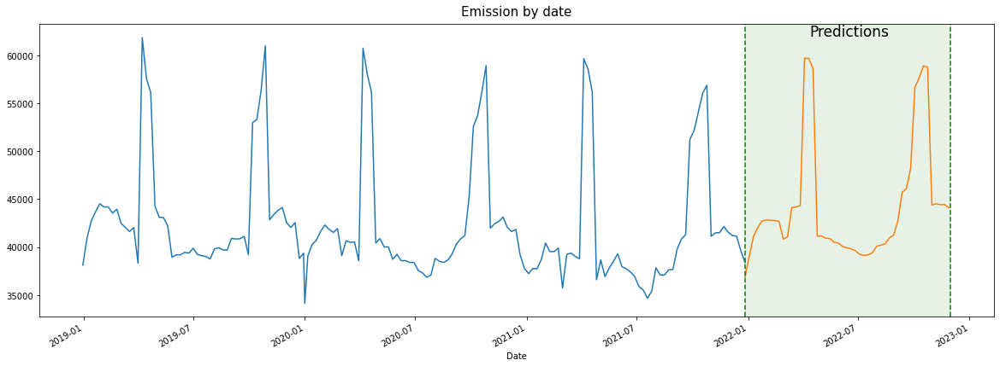

In [86]:
train_plot.groupby(['Date'])['emission'].sum().plot(kind='line', figsize=(20, 7), xlabel='Date')
pred_plot.groupby(['date'])['emission'].sum().plot(kind='line', figsize=(20, 7), xlabel='Date')

plt.axvspan(pd.Timestamp('2021-12-27'), pd.Timestamp('2022-12-01'), color='green', alpha=0.1)
plt.axvline(pd.Timestamp('2021-12-27'), linestyle = "--", color='green')
plt.axvline(pd.Timestamp('2022-12-01'), linestyle = "--", color='green')

plt.text(pd.Timestamp ('2022-04-12'), 62000, "Predictions", size = 17)

plt.title('Emission by date', size=15, pad=10)
plt.show()

In [92]:
sample_submission.to_csv('submission.csv')

In [94]:
from matplotlib import legend

# Function for evaluation metric for regression
def EvaluationMetric(Xt,yt,yp,disp="on"):
    ''' Take the different set of parameter and prints evaluation metrics '''
    MSE=round(mean_squared_error(y_true=yt,y_pred=yp),4)
    RMSE=(np.sqrt(MSE))
    R2=(r2_score(y_true=yt,y_pred=yp))
    Adjusted_R2=(1-(1-r2_score(yt, yp))*((Xt.shape[0]-1)/(Xt.shape[0]-Xt.shape[1]-1)))
    if disp=="on":
        print("MSE :",MSE,"RMSE :", RMSE)
        print("R2 :",R2,"Adjusted R2 :",Adjusted_R2)
    
    #Plotting Actual and Predicted Values
    plt.figure(figsize=(18,6))
    plt.plot((yp)[:100]) 
    plt.plot((np.array(yt)[:100]))
    plt.legend(["Predicted","Actual"])
    plt.title('Actual and Predicted Time Duration')
    
    return (MSE,RMSE,R2,Adjusted_R2)

* This code defines a function called smape which calculates the Symmetric Mean Absolute Percentage Error (SMAPE) between two sets of values: the predicted values (y_pred) and the true values (y_true). SMAPE is a metric used to measure the accuracy of a model's predictions in comparison to the actual values. It is often used in forecasting and time series analysis.

In [96]:
def smape(y_true, y_pred):
    numerator = np.abs(y_pred - y_true)
    denominator = np.abs(y_pred) + np.abs(y_true)
    return 200 * np.mean(np.divide(numerator, denominator, out=np.zeros_like(numerator), where=denominator!=0))

In [103]:
X_train, X_val, y_train, y_val = train_test_split(X_transformed, y, test_size=0.2, random_state=42)

In [104]:
X_train

,latitude,longitude,year,week_no_sin,week_no_cos,holidays,rot_15_x,rot_15_y,rot_30_x,rot_30_y
ID_LAT_LON_YEAR_WEEK,,,,,,,,,,
ID_-1.000_29.800_2019_37,1.181257,-0.068195,-1.224745e+00,-0.940928,-0.118968,-0.285714,0.141641,0.990087,0.355804,0.766328
ID_-1.143_30.957_2019_17,0.896369,1.201964,-1.224745e+00,0.803882,-0.218001,-0.285714,1.378666,1.302758,1.511460,1.495278
ID_-2.302_29.198_2019_50,-0.473175,-0.733520,-1.224745e+00,-0.215885,0.820660,-0.285714,-0.793224,-0.545816,-0.753099,-0.695211
ID_-2.302_29.198_2020_31,-0.473175,-0.733520,-7.682673e-12,-0.328221,-0.574325,-0.285714,-0.793224,-0.545816,-0.753099,-0.695211
ID_-1.514_29.686_2020_15,0.392507,-0.181124,-7.682673e-12,1.125777,-0.070012,-0.285714,-0.112188,0.230906,0.019469,0.151487
...,...,...,...,...,...,...,...,...,...,...
ID_-0.935_29.765_2020_11,1.365432,-0.121995,-7.682673e-12,1.025524,0.169331,-0.285714,0.121993,1.094106,0.361015,0.845380
ID_-2.319_31.181_2019_31,-0.495227,1.449081,-1.224745e+00,-0.328221,-0.574325,-0.285714,1.223228,-0.077954,0.903852,0.191036
ID_-3.028_28.872_2019_23,-1.860567,-1.089529,-1.224745e+00,0.252337,-0.737580,-0.285714,-1.352437,-2.274401,-1.703072,-2.091605


In [105]:
y_train

ID_LAT_LON_YEAR_WEEK
ID_-1.000_29.800_2019_37     51.501648
ID_-1.143_30.957_2019_17     12.656662
ID_-2.302_29.198_2019_50    278.141660
ID_-2.302_29.198_2020_31    243.862015
ID_-1.514_29.686_2020_15    606.444411
                               ...    
ID_-0.935_29.765_2020_11     28.499895
ID_-2.319_31.181_2019_31     50.417880
ID_-3.028_28.872_2019_23     47.655730
ID_-0.604_29.896_2020_12     80.934641
ID_-1.187_31.113_2020_01    337.351055
Name: emission, Length: 63218, dtype: float64

In [107]:
def objective(trial):
    rf_n_estimators = trial.suggest_int('rf_n_estimators', 50, 200)
    xgb_n_estimators = trial.suggest_int('xgb_n_estimators', 50, 200)
    catboost_iterations = trial.suggest_int('catboost_iterations', 50, 200)

    rf_regressor = RandomForestRegressor(n_estimators=rf_n_estimators, random_state=42,n_jobs=-1)
    xgb_regressor = XGBRegressor(n_estimators=xgb_n_estimators, random_state=42)
    catboost_regressor = CatBoostRegressor(iterations=catboost_iterations, random_state=42, verbose=0)

    voting_regressor = VotingRegressor(estimators=[
        ('rf', rf_regressor),
        ('xgb', xgb_regressor),
        ('catboost', catboost_regressor),
    ])

    voting_regressor.fit(X_train, y_train)

    voting_pred = voting_regressor.predict(X_val)

    rmse_voting = mean_squared_error(y_val, voting_pred, squared=False)

    return rmse_voting

study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=10,n_jobs=4, show_progress_bar=True)

best_params = study.best_params

[I 2023-08-17 01:17:38,136] A new study created in memory with name: no-name-1db519eb-5f3c-4e3f-9bf7-ff9d5db5955e


  0%|          | 0/10 [00:00<?, ?it/s]

[I 2023-08-17 01:18:35,639] Trial 3 finished with value: 21.550526334285752 and parameters: {'rf_n_estimators': 140, 'xgb_n_estimators': 91, 'catboost_iterations': 68}. Best is trial 3 with value: 21.550526334285752.
[I 2023-08-17 01:18:47,241] Trial 2 finished with value: 21.650915300099236 and parameters: {'rf_n_estimators': 65, 'xgb_n_estimators': 135, 'catboost_iterations': 56}. Best is trial 3 with value: 21.550526334285752.
[I 2023-08-17 01:19:18,111] Trial 0 finished with value: 20.292793873783978 and parameters: {'rf_n_estimators': 120, 'xgb_n_estimators': 177, 'catboost_iterations': 86}. Best is trial 0 with value: 20.292793873783978.
[I 2023-08-17 01:19:19,762] Trial 1 finished with value: 20.279053729604552 and parameters: {'rf_n_estimators': 136, 'xgb_n_estimators': 141, 'catboost_iterations': 188}. Best is trial 1 with value: 20.279053729604552.
[I 2023-08-17 01:20:26,932] Trial 5 finished with value: 20.599168726342235 and parameters: {'rf_n_estimators': 62, 'xgb_n_estima

In [108]:
best_rf_regressor = RandomForestRegressor(n_estimators=best_params['rf_n_estimators'], random_state=42)
best_xgb_regressor = XGBRegressor(n_estimators=best_params['xgb_n_estimators'], random_state=42)
best_catboost_regressor = CatBoostRegressor(iterations=best_params['catboost_iterations'], random_state=42, verbose=1)

In [109]:
best_rf_regressor.fit(X_train, y_train)
best_xgb_regressor.fit(X_train, y_train)
best_catboost_regressor.fit(X_train, y_train)

Learning rate set to 0.454264
0:	learn: 121.0418077	total: 8.66ms	remaining: 996ms
1:	learn: 107.6525472	total: 16.6ms	remaining: 949ms
2:	learn: 103.6006797	total: 24.5ms	remaining: 923ms
3:	learn: 97.8269135	total: 32.8ms	remaining: 917ms
4:	learn: 83.7919852	total: 41ms	remaining: 910ms
5:	learn: 80.9169452	total: 48.4ms	remaining: 886ms
6:	learn: 78.6980980	total: 55.7ms	remaining: 867ms
7:	learn: 77.5905902	total: 63.6ms	remaining: 859ms
8:	learn: 76.3523093	total: 71.5ms	remaining: 850ms
9:	learn: 75.7328331	total: 78.9ms	remaining: 836ms
10:	learn: 74.3319205	total: 86.5ms	remaining: 825ms
11:	learn: 69.6569080	total: 94.9ms	remaining: 823ms
12:	learn: 68.1320705	total: 102ms	remaining: 810ms
13:	learn: 67.2674125	total: 110ms	remaining: 799ms
14:	learn: 65.8734327	total: 118ms	remaining: 793ms
15:	learn: 64.2817751	total: 126ms	remaining: 787ms
16:	learn: 63.2169151	total: 134ms	remaining: 782ms
17:	learn: 62.2991156	total: 142ms	remaining: 775ms
18:	learn: 59.4870239	total: 15

# Evaluation Metric Random Forest

MSE : 42.9025 RMSE : 6.55
R2 : 0.9981471446249569 Adjusted R2 : 0.9981468514841062


(42.9025, 6.55, 0.9981471446249569, 0.9981468514841062)

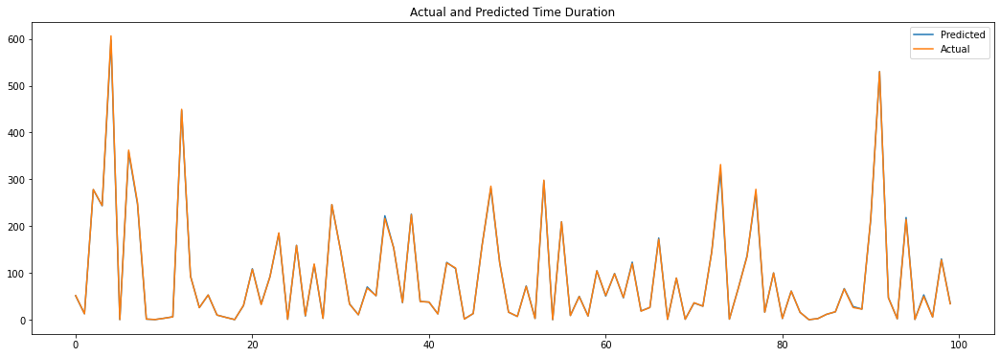

In [110]:
y_preds_rf_val = best_rf_regressor.predict(X_val)
y_pred_rf_train = best_rf_regressor.predict(X_train)

EvaluationMetric(X_train, y_train, y_pred_rf_train)

MSE : 391.4986 RMSE : 19.78632355946905
R2 : 0.9775541538335382 Adjusted R2 : 0.9775399422049662


(391.4986, 19.78632355946905, 0.9775541538335382, 0.9775399422049662)

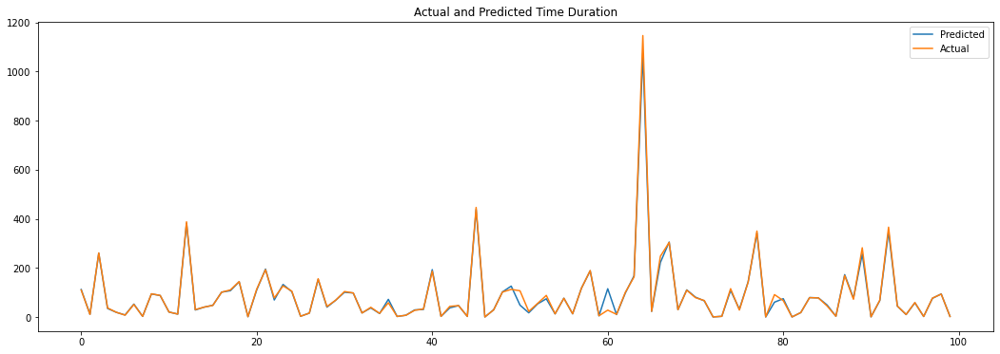

In [111]:
EvaluationMetric(X_val, y_val, y_preds_rf_val)

# Evaluation Metric XgBoost

MSE : 118.0326 RMSE : 10.864280924202946
R2 : 0.9949024559332567 Adjusted R2 : 0.9949016494491542


(118.0326, 10.864280924202946, 0.9949024559332567, 0.9949016494491542)

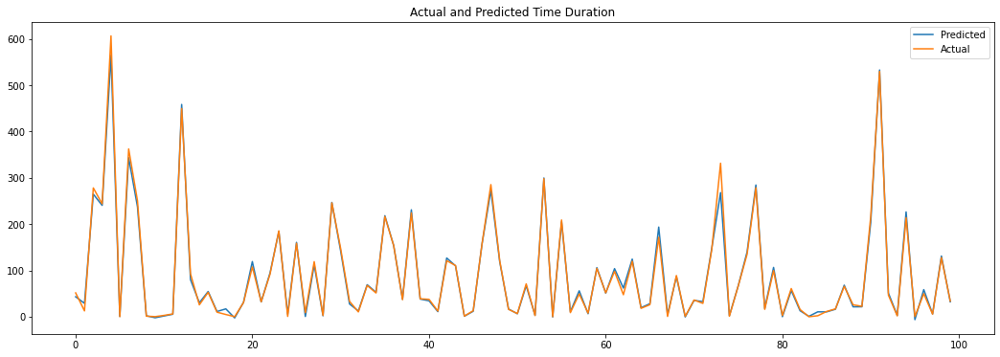

In [113]:
y_preds_xgb_val = best_xgb_regressor.predict(X_val)
y_pred_xgb_train = best_xgb_regressor.predict(X_train)

EvaluationMetric(X_train, y_train, y_pred_xgb_train)

MSE : 389.5756 RMSE : 19.73766956861929
R2 : 0.977664405691713 Adjusted R2 : 0.9776502638693069


(389.5756, 19.73766956861929, 0.977664405691713, 0.9776502638693069)

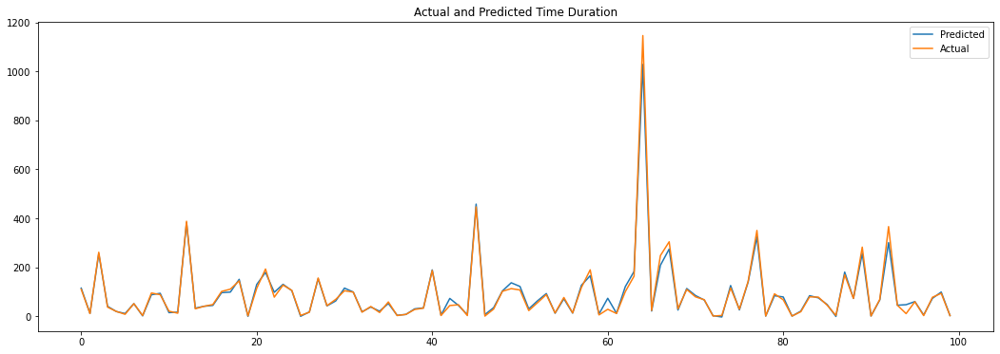

In [114]:
EvaluationMetric(X_val, y_val, y_preds_xgb_val)

# Evaluation Metric CatBoost

MSE : 499.168 RMSE : 22.342067943679698
R2 : 0.978442126657497 Adjusted R2 : 0.9784387159793533


(499.168, 22.342067943679698, 0.978442126657497, 0.9784387159793533)

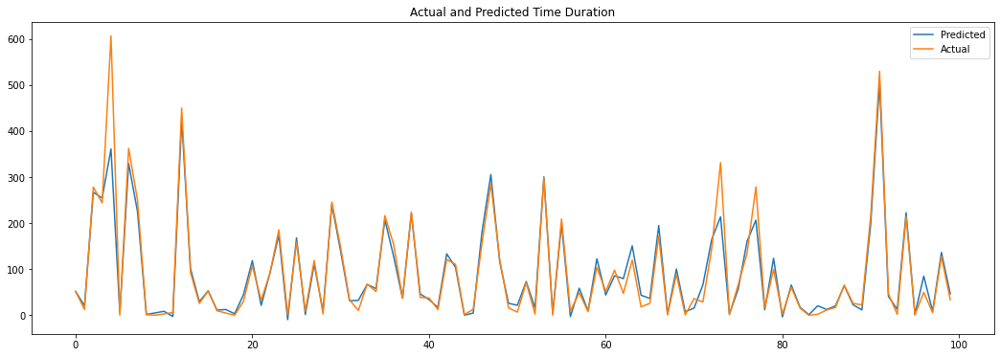

In [115]:
y_preds_cat_val = best_catboost_regressor.predict(X_val)
y_pred_cat_train = best_catboost_regressor.predict(X_train)

EvaluationMetric(X_train, y_train, y_pred_cat_train)

MSE : 658.858 RMSE : 25.668229389656
R2 : 0.96222560005031 Adjusted R2 : 0.9622016831198619


(658.858, 25.668229389656, 0.96222560005031, 0.9622016831198619)

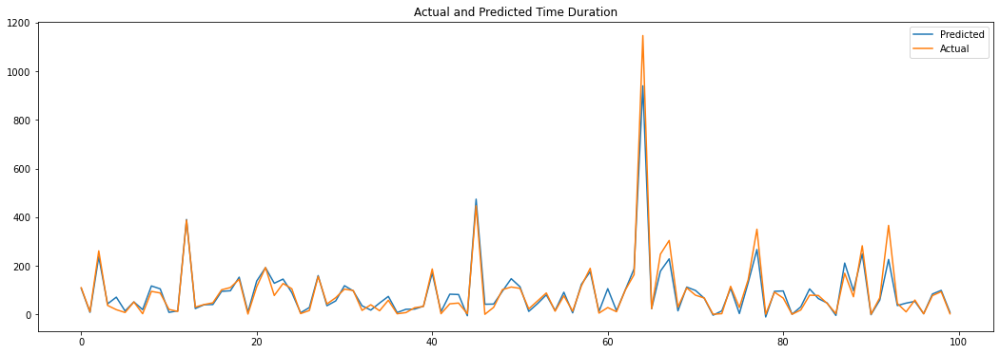

In [116]:
EvaluationMetric(X_val, y_val, y_preds_cat_val)

* So far Xgboost has won we'll move forward with that

In [117]:
voting_regressor = VotingRegressor(estimators=[(
    'rf', best_rf_regressor),('xgb', best_xgb_regressor),('catboost', best_catboost_regressor),])

In [118]:
voting_regressor.fit(X_train, y_train)
prediction = voting_regressor.predict(X_val)

Learning rate set to 0.454264
0:	learn: 121.0418077	total: 8.23ms	remaining: 947ms
1:	learn: 107.6525472	total: 16.1ms	remaining: 916ms
2:	learn: 103.6006797	total: 23.4ms	remaining: 882ms
3:	learn: 97.8269135	total: 31.9ms	remaining: 893ms
4:	learn: 83.7919852	total: 40.3ms	remaining: 895ms
5:	learn: 80.9169452	total: 48.3ms	remaining: 886ms
6:	learn: 78.6980980	total: 56ms	remaining: 871ms
7:	learn: 77.5905902	total: 64.3ms	remaining: 868ms
8:	learn: 76.3523093	total: 72ms	remaining: 856ms
9:	learn: 75.7328331	total: 79.2ms	remaining: 839ms
10:	learn: 74.3319205	total: 86.1ms	remaining: 822ms
11:	learn: 69.6569080	total: 94.5ms	remaining: 819ms
12:	learn: 68.1320705	total: 102ms	remaining: 808ms
13:	learn: 67.2674125	total: 109ms	remaining: 797ms
14:	learn: 65.8734327	total: 117ms	remaining: 788ms
15:	learn: 64.2817751	total: 125ms	remaining: 780ms
16:	learn: 63.2169151	total: 133ms	remaining: 774ms
17:	learn: 62.2991156	total: 141ms	remaining: 770ms
18:	learn: 59.4870239	total: 150m

MSE : 400.7072 RMSE : 20.01767219234045
R2 : 0.9770261976015739 Adjusted R2 : 0.9770116516965477


(400.7072, 20.01767219234045, 0.9770261976015739, 0.9770116516965477)

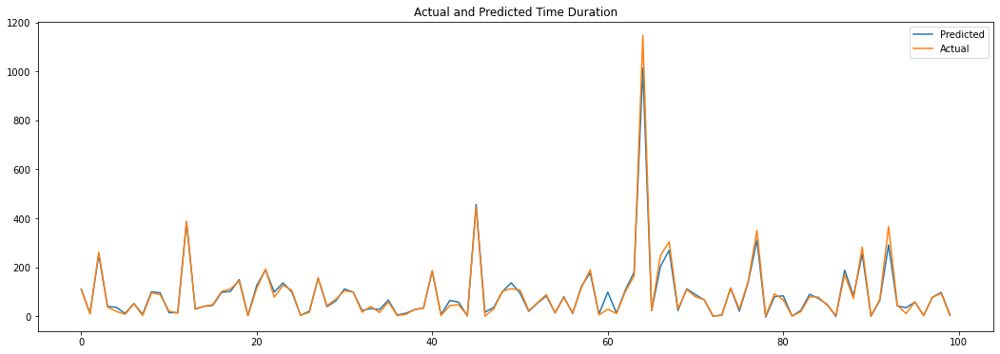

In [119]:
EvaluationMetric(X_val, y_val, prediction)

In [120]:
X_test

,latitude,longitude,year,week_no_sin,week_no_cos,holidays,rot_15_x,rot_15_y,rot_30_x,rot_30_y
0,5.042486,-0.621668,1.224745,-1.380254e-12,3.527765,3.500000,-0.258540,1.659345,0.171226,1.014999
1,5.042486,-0.621668,1.224745,7.045284e-02,1.164104,-0.285714,-0.258540,1.659345,0.171226,1.014999
2,5.042486,-0.621668,1.224745,1.424934e-01,1.004047,-0.285714,-0.258540,1.659345,0.171226,1.014999
3,5.042486,-0.621668,1.224745,2.158849e-01,0.885386,-0.285714,-0.258540,1.659345,0.171226,1.014999
4,5.042486,-0.621668,1.224745,2.894000e-01,0.734614,-0.285714,-0.258540,1.659345,0.171226,1.014999
...,...,...,...,...,...,...,...,...,...,...
24348,-5.042486,0.413731,1.224745,-7.430180e-01,0.335896,-0.285714,0.024337,-1.802666,-0.371468,-1.131711
24349,-5.042486,0.413731,1.224745,-6.340661e-01,0.371524,-0.285714,0.024337,-1.802666,-0.371468,-1.131711
24350,-5.042486,0.413731,1.224745,-5.371607e-01,0.464134,-0.285714,0.024337,-1.802666,-0.371468,-1.131711
24351,-5.042486,0.413731,1.224745,-4.507926e-01,0.565631,-0.285714,0.024337,-1.802666,-0.371468,-1.131711


In [121]:
test_rf_predictions = best_rf_regressor.predict(X_test)
test_xgb_predictions = best_xgb_regressor.predict(X_test)
test_catboost_predictions = best_catboost_regressor.predict(X_test)

prediction_test = voting_regressor.predict(X_test)

In [123]:
sample_submission['emission'] = prediction_test

In [124]:
sample_submission

,emission
ID_LAT_LON_YEAR_WEEK,
ID_-0.510_29.290_2022_00,1.453086
ID_-0.510_29.290_2022_01,4.897375
ID_-0.510_29.290_2022_02,6.464941
ID_-0.510_29.290_2022_03,6.501301
ID_-0.510_29.290_2022_04,6.070281
...,...
ID_-3.299_30.301_2022_44,27.005692
ID_-3.299_30.301_2022_45,27.386298
ID_-3.299_30.301_2022_46,27.158926


In [125]:
prediction_test[prediction_test<0] = 0

mask = test_df.apply(lambda x: (x['latitude'], x['longitude']) in zero_emissions.index, axis=1)
prediction_test[mask] = 0

In [126]:
sample_submission['emission'] = predictions * 1.07

In [128]:
sample_submission.to_csv('submission_1.csv')

In [ ]:
https://www.kaggle.com/code/kacperrabczewski/rwanda-co2-step-by-step-guide
    
https://www.kaggle.com/code/oscarm524/ps-s3-ep20-eda-modeling-submission
    
    
https://www.kaggle.com/code/muhannadmansour/eda-voting-randomforest-xgboost-catboost for model buiding